Copyright 2024 Hewlett Packard Enterprise Development LP.

## Analysis of Simulations



# Remove the cpu.all from the pmdumptext and use cpu.all.local

In [1]:
# Import libraries
library(dplyr)
library(tidyr)
library(ggplot2)
library(data.table)
#library(gridExtra)
library(patchwork)
library(RColorBrewer)
library(scales)
library(patchwork)
#library(viridis)
library(patchwork)
library(grid) 


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last




## Creating Functions

column_names <-c("or", "d", "ddate", "rdate", "changes", "class", "price", "fdate", "company", "number", "dur", "added", "source", "key") 
column_classes <- c("factor", "factor", "factor", "factor", "integer", "factor", "integer", "factor", "factor", "factor", "integer", "factor", "factor", "NULL") 

data <- fread(zz3, header = FALSE, sep = ",", skip = 1, na.strings = c(""), colClasses = column_classes)
setnames(data, column_names)

In [ ]:
viridis_colors <- c("#440154FF", "white", "#482777FF","#3E4A8EFF","#2C7FB8FF", "#1F9E89FF","#FDE725FF")
viridis_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)  # Generate a palette
#viridis_colors <- colorRampPalette(brewer.pal(11, "RdBu"))(6)  # Generate a palette
viridis_colors <- c(viridis_colors[1:1], "white", viridis_colors[2:2])
#viridis_colors <- c(brewer.pal(9, "RdYlGn")[1:1], "white", brewer.pal(9, "RdYlGn")[2:5])

colors <- c(brewer.pal(11, "RdYlGn")[1:1], brewer.pal(11, "RdYlGn")[7:11])
viridis_colors <- c(colors[1:1], "white", colors[3:6])

colorRampPalette(brewer.pal(11, "RdYlGn"))(10)
palette_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)
palette_colors <- c('#229C52', '#DA362A')

In [2]:
# Create function to read and combine all csv files
read_and_bind_all_files <- function(path, pattern = "*.csv") {
    files = list.files(path, pattern, full.names = TRUE)
    rbindlist(
        lapply(files, 
            function(x) {
                exp <- strsplit(x, split = "/")[[1]][6]
                #print(exp)
                # "gromacs_" + str(n_cores) + "_" + str(n_parallel_invokations) + "_" + str(exec_id) + "_" + str(repetition_id)
                # "log_gromacs_80_10_8_1_1.log.csv"
                name <- strsplit(exp, split = "-")[[1]][1]
                size <- strsplit(exp, split = "-")[[1]][2]
                #size <- as.integer(strsplit(strsplit(exp, split = "-")[[1]][2], split = "\\.")[[1]][1]) #here I needed to remove the .log.csv
                cpu_work <- as.integer(strsplit(strsplit(exp, split = "-")[[1]][3], split = "_")[[1]][1]) #here I needed to remove the .log.csv
                
                t <- fread(x, header = FALSE, fill=TRUE, sep=',', skip = 1)
                t$name <- name
                t$size <- size
                t$cpu_work <- cpu_work
                #t$seed <- seed
                t
            }
        ),fill=TRUE)
}

# Create a label for the plots with facets
label_scenarios <- labeller(
        metric = c('execution_time' = "Exec. Time (s)", 
                   'mean_power' = "Power (W/10)", 
                   'mean_cpu' = "CPU Time (s)", 
                   'mean_memory' = "Memory (MB)"),
       paradigm = c('knative-level-1w' = "Knative-1w/p", 
                    'knative-level-1w-novm' = "Knative-1w/p-NoPM", 
                    'knative-level-10w-novm' = "Knative-10w/p-NoPM", 
                    'local-container-96w' = "Local Container-1w/c", 
                    'local-container-96w-novm' = "Local Container-1w/c-NoPM", 
                    'local-container-960w-novm' = "Local Container-10w/c-NoPM")
    )
label_paradigm <- c('knative-level-1w' = "Knative-1w/p", 
                    'knative-level-1w-novm' = "Knative-1w/p-NoPM", 
                    'knative-level-10w-novm' = "Knative-10w/p-NoPM", 
                    'local-container-96w' = "Local Container-1w/c", 
                    'local-container-96w-novm' = "Local Container-1w/c-NoPM", 
                    'local-container-960w-novm' = "Local Container-10w/c-NoPM",
                    'local-container-960w-novm' = "Local Container-10w/c-NoPM")
label_paradigm <- c('knative-level-1w' = "Kn1wPM", 
                    'knative-level-1w-novm' = "Kn1wNoPM", 
                    'knative-level-10w-novm' = "Kn10wNoPM", 
                    'local-container-96w' = "LC1wPM", 
                    'local-container-96w-novm' = "LC1wNoPM", 
                    'local-container-960w-novm' = "LC10wNoPM",
                    'local-container-960w-novm' = "LC10wNoPMNoCR")

#label_scenarios <- labeller(
#        w_size = c('200' = "Workload Size = 200"),
#        p_size = c('100' = "Platform Size = 100")
#    )

## Reading and Processing Files

### Scheduling Time and Makespan from Simulations

In [3]:
df_all_knative_level_1000w <- read_and_bind_all_files(
    paste('./wfbench/csv/knative-level/',sep=','))
df_all_knative_level_1000w <- df_all_knative_level_1000w %>% filter(cpu_work != 1000)  #na.omit(df_all_knative_level_1000w)
df_all_knative_level_1000w <- df_all_knative_level_1000w %>% select(-V6, -V7, -V8, -V9, -V10)
names(df_all_knative_level_1000w) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_knative_level_1000w$timestamp <- as.POSIXct(df_all_knative_level_1000w$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_knative_level_1000w$size <- as.numeric(df_all_knative_level_1000w$size)
df_all_knative_level_1000w$cpu <- as.numeric(df_all_knative_level_1000w$cpu)
df_all_knative_level_1000w$memory <- as.numeric(df_all_knative_level_1000w$memory)
df_all_knative_level_1000w$energy0 <- as.numeric(df_all_knative_level_1000w$energy0)
df_all_knative_level_1000w$energy1 <- as.numeric(df_all_knative_level_1000w$energy1)
df_all_knative_level_1000w$paradigm <- 'knative-level-1000w'
df_all_knative_level_1000w$abbreviation <- "Kn1000wPM"

# Replace NAs with the last previous valid value for each column
df_all_knative_level_1000w <- df_all_knative_level_1000w %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)
# remove 10 first lines
# remove 20 final lines
df_all_knative_level_1000w <- df_all_knative_level_1000w %>% slice(-(1:10)) %>% slice(1:(n() - 20))

head(df_all_knative_level_1000w)
tail(df_all_knative_level_1000w)

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-22 06:54:03,18110.28,20718592,103.944,121.935,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:04,22955.53,21684180,96.023,117.028,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:05,22650.11,22527676,148.001,138.001,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:06,19883.70,24692588,179.033,174.032,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:07,60547.45,26599712,177.022,171.021,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:08,75026.60,25367556,178.016,171.021,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-22 08:06:16,70643.19,32677708,172.959,167.005,SrasearchRecipe,500,100,knative-level-1000w,Kn1000wPM
24-07-22 08:06:17,55823.74,34078012,173.012,166.011,SrasearchRecipe,500,100,knative-level-1000w,Kn1000wPM
24-07-22 08:06:18,32466.04,36368976,174.032,167.031,SrasearchRecipe,500,100,knative-level-1000w,Kn1000wPM
24-07-22 08:06:19,25917.62,39082328,174.051,166.049,SrasearchRecipe,500,100,knative-level-1000w,Kn1000wPM
24-07-22 08:06:20,25136.53,39816064,173.976,162.978,SrasearchRecipe,500,100,knative-level-1000w,Kn1000wPM
24-07-22 08:06:21,23757.15,41684304,174.979,164.980,SrasearchRecipe,500,100,knative-level-1000w,Kn1000wPM


In [4]:
df_all_knative_scaling_1w <- read_and_bind_all_files(
    paste('./wfbench/csv/knative-scaling-1w/',sep=','))

names(df_all_knative_scaling_1w) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_knative_scaling_1w$timestamp <- as.POSIXct(df_all_knative_scaling_1w$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_knative_scaling_1w$cpu <- as.numeric(df_all_knative_scaling_1w$cpu)
df_all_knative_scaling_1w$size <- as.numeric(df_all_knative_scaling_1w$size)
df_all_knative_scaling_1w$memory <- as.numeric(df_all_knative_scaling_1w$memory)
df_all_knative_scaling_1w$energy0 <- as.numeric(df_all_knative_scaling_1w$energy0)
df_all_knative_scaling_1w$energy1 <- as.numeric(df_all_knative_scaling_1w$energy1)
df_all_knative_scaling_1w$paradigm <- 'knative-level-1w'
df_all_knative_scaling_1w$abbreviation <- "Kn1wPM"

# Replace NAs with the last previous valid value for each column
df_all_knative_scaling_1w <- df_all_knative_scaling_1w %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

df_all_knative_scaling_1w <- na.omit(df_all_knative_scaling_1w)
# remove 10 first lines
# remove 20 final lines
df_all_knative_scaling_1w <- df_all_knative_scaling_1w %>% slice(-(1:10)) %>% slice(1:(n() - 20))

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


In [5]:
df_all_knative_scaling_1w_novm <- read_and_bind_all_files(
    paste('./wfbench/csv/knative-scaling-1w-novm/',sep=','))

names(df_all_knative_scaling_1w_novm) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_knative_scaling_1w_novm$timestamp <- as.POSIXct(df_all_knative_scaling_1w_novm$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_knative_scaling_1w_novm$cpu <- as.numeric(df_all_knative_scaling_1w_novm$cpu)
df_all_knative_scaling_1w_novm$size <- as.numeric(df_all_knative_scaling_1w_novm$size)
df_all_knative_scaling_1w_novm$memory <- as.numeric(df_all_knative_scaling_1w_novm$memory)
df_all_knative_scaling_1w_novm$energy0 <- as.numeric(df_all_knative_scaling_1w_novm$energy0)
df_all_knative_scaling_1w_novm$energy1 <- as.numeric(df_all_knative_scaling_1w_novm$energy1)
df_all_knative_scaling_1w_novm$paradigm <- 'knative-level-1w-novm'
df_all_knative_scaling_1w_novm$abbreviation <- "Kn1wNoPM"

# Replace NAs with the last previous valid value for each column
df_all_knative_scaling_1w_novm <- df_all_knative_scaling_1w_novm %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

head(df_all_knative_scaling_1w_novm)
tail(df_all_knative_scaling_1w_novm)
# remove 10 first lines
# remove 20 final lines
df_all_knative_scaling_1w_novm <- df_all_knative_scaling_1w_novm %>% slice(-(1:10)) %>% slice(1:(n() - 20))

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-25 11:00:40,2409.863,12189016,62.996,47.997,BlastRecipe,250,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 11:00:41,779.824,12185864,54.988,43.990,BlastRecipe,250,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 11:00:42,1259.848,12183212,58.993,46.994,BlastRecipe,250,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 11:00:43,1640.317,12182920,58.011,48.009,BlastRecipe,250,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 11:00:44,589.761,12186992,55.977,44.982,BlastRecipe,250,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 11:00:45,300.044,12182572,51.007,42.006,BlastRecipe,250,100,knative-level-1w-novm,Kn1wNoPM


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-25 13:02:02,689.952,13353276,56.996,44.997,SrasearchRecipe,500,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 13:02:03,1959.877,13351236,62.996,50.997,SrasearchRecipe,500,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 13:02:04,890.150,13342136,61.010,50.008,SrasearchRecipe,500,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 13:02:05,819.812,13341436,57.987,48.989,SrasearchRecipe,500,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 13:02:06,859.807,13336656,58.987,48.989,SrasearchRecipe,500,100,knative-level-1w-novm,Kn1wNoPM
24-07-25 13:02:07,490.106,13332352,56.012,46.010,SrasearchRecipe,500,100,knative-level-1w-novm,Kn1wNoPM


In [6]:
df_all_knative_scaling_10w_novm <- read_and_bind_all_files(
    paste('./wfbench/csv/knative-scaling-10w-novm/',sep=','))

names(df_all_knative_scaling_10w_novm) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_knative_scaling_10w_novm$timestamp <- as.POSIXct(df_all_knative_scaling_10w_novm$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_knative_scaling_10w_novm$cpu <- as.numeric(df_all_knative_scaling_10w_novm$cpu)
df_all_knative_scaling_10w_novm$size <- as.numeric(df_all_knative_scaling_10w_novm$size)
df_all_knative_scaling_10w_novm$memory <- as.numeric(df_all_knative_scaling_10w_novm$memory)
df_all_knative_scaling_10w_novm$energy0 <- as.numeric(df_all_knative_scaling_10w_novm$energy0)
df_all_knative_scaling_10w_novm$energy1 <- as.numeric(df_all_knative_scaling_10w_novm$energy1)
df_all_knative_scaling_10w_novm$paradigm <- 'knative-level-10w-novm'
df_all_knative_scaling_10w_novm$abbreviation <- "Kn10wNoPM"

# Replace NAs with the last previous valid value for each column
df_all_knative_scaling_10w_novm <- df_all_knative_scaling_10w_novm %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

head(df_all_knative_scaling_10w_novm)
tail(df_all_knative_scaling_10w_novm)
# remove 10 first lines
# remove 20 final lines
df_all_knative_scaling_10w_novm <- df_all_knative_scaling_10w_novm %>% slice(-(1:10)) %>% slice(1:(n() - 20))

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-25 14:55:42,1208.686,13082128,62.090,48.844,BlastRecipe,250,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 14:55:43,997.451,13079872,56.817,46.716,BlastRecipe,250,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 14:55:44,2580.108,13385100,72.003,62.003,BlastRecipe,250,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 14:55:45,729.895,13414332,63.991,52.992,BlastRecipe,250,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 14:55:46,12320.209,13884380,88.001,82.001,BlastRecipe,250,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 14:55:47,799.856,13913684,58.989,49.991,BlastRecipe,250,100,knative-level-10w-novm,Kn10wNoPM


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-25 15:15:06,900.250,15084812,58.016,47.013,SrasearchRecipe,500,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 15:15:07,1299.848,15083352,57.993,46.995,SrasearchRecipe,500,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 15:15:08,1020.045,15084220,59.003,48.002,SrasearchRecipe,500,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 15:15:09,1684.402,15084488,57.132,44.326,SrasearchRecipe,500,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 15:15:10,1309.650,15082260,58.883,45.685,SrasearchRecipe,500,100,knative-level-10w-novm,Kn10wNoPM
24-07-25 15:15:11,1040.128,15106576,58.007,48.006,SrasearchRecipe,500,100,knative-level-10w-novm,Kn10wNoPM


In [7]:
df_all_local_level_1000w <- read_and_bind_all_files(
    paste('./wfbench/csv/local-level/',sep=','))

df_all_local_level_1000w <- df_all_local_level_1000w %>% filter(cpu_work != 1000)  #na.omit(df_all_knative_level_1000w)
#df_all_local_level_1000w <- df_all_local_level_1000w %>% select(-V6, -V7, -V8, -V9, -V10)
names(df_all_local_level_1000w) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")


names(df_all_local_level_1000w) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_local_level_1000w$timestamp <- as.POSIXct(df_all_local_level_1000w$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_local_level_1000w$cpu <- as.numeric(df_all_local_level_1000w$cpu)
df_all_local_level_1000w$size <- as.numeric(df_all_local_level_1000w$size)
df_all_local_level_1000w$memory <- as.numeric(df_all_local_level_1000w$memory)
df_all_local_level_1000w$energy0 <- as.numeric(df_all_local_level_1000w$energy0)
df_all_local_level_1000w$energy1 <- as.numeric(df_all_local_level_1000w$energy1)
df_all_local_level_1000w$paradigm <- "local-container-1000w"
df_all_local_level_1000w$abbreviation <- "LC1000wPM"

# Replace NAs with the last previous valid value for each column
df_all_local_level_1000w <- df_all_local_level_1000w %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

head(df_all_local_level_1000w)
tail(df_all_local_level_1000w)
# remove 10 first lines
# remove 20 final lines
#df_all_local_level <- df_all_local_level %>% slice(-(1:10)) %>% slice(1:(n() - 20))


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-22 03:52:27,2108.851,23272540,61.966,52.971,BlastRecipe,1000,100,local-container-1000w,LC1000wPM
24-07-22 03:52:28,1750.471,23276764,62.017,51.014,BlastRecipe,1000,100,local-container-1000w,LC1000wPM
24-07-22 03:52:29,8891.102,23317404,68.008,59.007,BlastRecipe,1000,100,local-container-1000w,LC1000wPM
24-07-22 03:52:30,1659.447,23907440,65.978,54.982,BlastRecipe,1000,100,local-container-1000w,LC1000wPM
24-07-22 03:52:31,930.203,23737492,64.014,54.012,BlastRecipe,1000,100,local-container-1000w,LC1000wPM
24-07-22 03:52:32,2920.450,23269060,71.011,61.009,BlastRecipe,1000,100,local-container-1000w,LC1000wPM


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-22 06:02:30,1050.088,26294080,61.005,51.004,SrasearchRecipe,500,100,local-container-1000w,LC1000wPM
24-07-22 06:02:31,16731.272,25174324,71.005,61.005,SrasearchRecipe,500,100,local-container-1000w,LC1000wPM
24-07-22 06:02:32,10658.689,27104732,76.991,61.992,SrasearchRecipe,500,100,local-container-1000w,LC1000wPM
24-07-22 06:02:33,1099.894,25113396,64.994,58.994,SrasearchRecipe,500,100,local-container-1000w,LC1000wPM
24-07-22 06:02:34,8391.250,25109832,72.011,58.009,SrasearchRecipe,500,100,local-container-1000w,LC1000wPM
24-07-22 06:02:35,1339.687,26076444,65.985,55.987,SrasearchRecipe,500,100,local-container-1000w,LC1000wPM


In [8]:
df_all_local_container_96w <- read_and_bind_all_files(
    paste('./wfbench/csv/local-container-96w/',sep=','))

names(df_all_local_container_96w) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_local_container_96w$timestamp <- as.POSIXct(df_all_local_container_96w$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_local_container_96w$cpu <- as.numeric(df_all_local_container_96w$cpu)
df_all_local_container_96w$size <- as.numeric(df_all_local_container_96w$size)
df_all_local_container_96w$memory <- as.numeric(df_all_local_container_96w$memory)
df_all_local_container_96w$energy0 <- as.numeric(df_all_local_container_96w$energy0)
df_all_local_container_96w$energy1 <- as.numeric(df_all_local_container_96w$energy1)
df_all_local_container_96w$paradigm <- 'local-container-96w'
df_all_local_container_96w$abbreviation <- "LC1wPM"

# Replace NAs with the last previous valid value for each column
df_all_local_container_96w <- df_all_local_container_96w %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

head(df_all_local_container_96w)
# remove 10 first lines
# remove 20 final lines
#df_all_local_level <- df_all_local_level %>% slice(-(1:10)) %>% slice(1:(n() - 20))

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-25 06:55:30,1890.130,12434284,62.004,53.004,BlastRecipe,250,100,local-container-96w,LC1wPM
24-07-25 06:55:31,920.277,12439676,55.017,45.014,BlastRecipe,250,100,local-container-96w,LC1wPM
24-07-25 06:55:32,45525.203,12847212,88.913,80.920,BlastRecipe,250,100,local-container-96w,LC1wPM
24-07-25 06:55:33,83422.380,14154612,106.560,98.666,BlastRecipe,250,100,local-container-96w,LC1wPM
24-07-25 06:55:34,81889.805,13021104,133.896,134.911,BlastRecipe,250,100,local-container-96w,LC1wPM
24-07-25 06:55:35,88851.269,12982384,179.881,175.884,BlastRecipe,250,100,local-container-96w,LC1wPM


In [9]:
df_all_local_container_96w_novm <- read_and_bind_all_files(
    paste('./wfbench/csv/local-container-96w-novm/',sep=','))

names(df_all_local_container_96w_novm) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_local_container_96w_novm$timestamp <- as.POSIXct(df_all_local_container_96w_novm$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_local_container_96w_novm$cpu <- as.numeric(df_all_local_container_96w_novm$cpu)
df_all_local_container_96w_novm$size <- as.numeric(df_all_local_container_96w_novm$size)
df_all_local_container_96w_novm$memory <- as.numeric(df_all_local_container_96w_novm$memory)
df_all_local_container_96w_novm$energy0 <- as.numeric(df_all_local_container_96w_novm$energy0)
df_all_local_container_96w_novm$energy1 <- as.numeric(df_all_local_container_96w_novm$energy1)
df_all_local_container_96w_novm$paradigm <- 'local-container-96w-novm'
df_all_local_container_96w_novm$abbreviation <- "LC1wNoPM"

# Replace NAs with the last previous valid value for each column
df_all_local_container_96w_novm <- df_all_local_container_96w_novm %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

head(df_all_local_container_96w_novm)
# remove 10 first lines
# remove 20 final lines
#df_all_local_level <- df_all_local_level %>% slice(-(1:10)) %>% slice(1:(n() - 20))

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-25 14:16:05,739.814,17423640,59.985,48.988,BlastRecipe,250,100,local-container-96w-novm,LC1wNoPM
24-07-25 14:16:06,490.002,17425192,55.000,46.000,BlastRecipe,250,100,local-container-96w-novm,LC1wNoPM
24-07-25 14:16:07,46267.081,17677432,89.723,78.757,BlastRecipe,250,100,local-container-96w-novm,LC1wNoPM
24-07-25 14:16:08,83863.981,19756164,109.739,100.113,BlastRecipe,250,100,local-container-96w-novm,LC1wNoPM
24-07-25 14:16:09,75361.565,20164216,143.585,132.140,BlastRecipe,250,100,local-container-96w-novm,LC1wNoPM
24-07-25 14:16:10,88444.676,18018080,179.050,175.049,BlastRecipe,250,100,local-container-96w-novm,LC1wNoPM


In [10]:
df_all_local_container_960w_novm <- read_and_bind_all_files(
    paste('./wfbench/csv/local-container-960w-novm/',sep=','))

names(df_all_local_container_960w_novm) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_local_container_960w_novm$timestamp <- as.POSIXct(df_all_local_container_960w_novm$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_local_container_960w_novm$cpu <- as.numeric(df_all_local_container_960w_novm$cpu)
df_all_local_container_960w_novm$size <- as.numeric(df_all_local_container_960w_novm$size)
df_all_local_container_960w_novm$memory <- as.numeric(df_all_local_container_960w_novm$memory)
df_all_local_container_960w_novm$energy0 <- as.numeric(df_all_local_container_960w_novm$energy0)
df_all_local_container_960w_novm$energy1 <- as.numeric(df_all_local_container_960w_novm$energy1)
df_all_local_container_960w_novm$paradigm <- 'local-container-960w-novm'
df_all_local_container_960w_novm$abbreviation <- "LC10wNoPM"

# Replace NAs with the last previous valid value for each column
df_all_local_container_960w_novm <- df_all_local_container_960w_novm %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

head(df_all_local_container_960w_novm)
# remove 10 first lines
# remove 20 final lines
#df_all_local_level <- df_all_local_level %>% slice(-(1:10)) %>% slice(1:(n() - 20))

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-26 00:03:16,19895.17,54202836,174.957,158.961,BlastRecipe,250,100,local-container-960w-novm,LC10wNoPM
24-07-26 00:03:17,20081.41,55200688,167.012,165.012,BlastRecipe,250,100,local-container-960w-novm,LC10wNoPM
24-07-26 00:03:18,36970.27,57012860,171.676,170.678,BlastRecipe,250,100,local-container-960w-novm,LC10wNoPM
24-07-26 00:03:19,83545.52,57823584,178.948,173.949,BlastRecipe,250,100,local-container-960w-novm,LC10wNoPM
24-07-26 00:03:20,73843.74,63681636,179.033,173.032,BlastRecipe,250,100,local-container-960w-novm,LC10wNoPM
24-07-26 00:03:21,76274.37,62570708,179.071,171.112,BlastRecipe,250,100,local-container-960w-novm,LC10wNoPM


In [11]:
df_all_local_container_960w_novm_nocpurequest <- read_and_bind_all_files(
    paste('./wfbench/csv/local-container-960w-novm-nocpurequest/',sep=','))
head(df_all_local_container_960w_novm_nocpurequest)
names(df_all_local_container_960w_novm_nocpurequest) <- c("timestamp","cpu","memory","energy0","energy1", "name", "size", "cpu_work")
df_all_local_container_960w_novm_nocpurequest$timestamp <- as.POSIXct(df_all_local_container_960w_novm_nocpurequest$timestamp,format="%d/%m/%Y %H:%M:%S",tz=Sys.timezone())
df_all_local_container_960w_novm_nocpurequest$cpu <- as.numeric(df_all_local_container_960w_novm_nocpurequest$cpu)
df_all_local_container_960w_novm_nocpurequest$size <- as.numeric(df_all_local_container_960w_novm_nocpurequest$size)
df_all_local_container_960w_novm_nocpurequest$memory <- as.numeric(df_all_local_container_960w_novm_nocpurequest$memory)
df_all_local_container_960w_novm_nocpurequest$energy0 <- as.numeric(df_all_local_container_960w_novm_nocpurequest$energy0)
df_all_local_container_960w_novm_nocpurequest$energy1 <- as.numeric(df_all_local_container_960w_novm_nocpurequest$energy1)
df_all_local_container_960w_novm_nocpurequest$paradigm <- 'local-container-960w-novm-nocpurequest'
df_all_local_container_960w_novm_nocpurequest$abbreviation <- "LC10wNoPMNoCR"

# Replace NAs with the last previous valid value for each column
df_all_local_container_960w_novm_nocpurequest <- df_all_local_container_960w_novm_nocpurequest %>%
  fill(everything(), .direction = "down")  # 'down' fills with the previous value
#df_all_knative_level_1000w <- na.omit(df_all_knative_level_1000w)

# remove 10 first lines
# remove 20 final lines
#df_all_local_level <- df_all_local_level %>% slice(-(1:10)) %>% slice(1:(n() - 20))

V1,V2,V3,V4,V5,name,size,cpu_work
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<int>
31/07/24 01:20:04,1989.336,59632752,64.978,55.981,BlastRecipe,250,100
31/07/24 01:20:05,2019.952,59637980,62.998,55.999,BlastRecipe,250,100
31/07/24 01:20:06,47994.969,60414864,93.833,86.426,BlastRecipe,250,100
31/07/24 01:20:07,84216.808,61284100,111.73,130.775,BlastRecipe,250,100
31/07/24 01:20:08,82032.737,63491684,134.234,139.242,BlastRecipe,250,100
31/07/24 01:20:09,77581.343,70316808,181.073,176.071,BlastRecipe,250,100


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


In [12]:
#df_all_out_execution_time <- rbind(df_all_knative_sequential, df_all_knative_level, df_all_local_level)
#df_all_out_execution_time <- rbind(df_all_knative_scaling_1, df_all_local_level, df_all_local_container)
df_all_out_execution_time <- rbind(
    df_all_knative_level_1000w,
    df_all_knative_scaling_1w, 
    df_all_knative_scaling_1w_novm,
    df_all_knative_scaling_10w_novm,
    df_all_local_level_1000w,
    df_all_local_container_96w,
    df_all_local_container_96w_novm,
    df_all_local_container_960w_novm,
    df_all_local_container_960w_novm_nocpurequest
)

head(df_all_out_execution_time)
tail(df_all_out_execution_time)
summary(df_all_out_execution_time)
str(summary(df_all_out_execution_time))

timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-22 06:54:03,18110.28,20718592,103.944,121.935,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:04,22955.53,21684180,96.023,117.028,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:05,22650.11,22527676,148.001,138.001,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:06,19883.70,24692588,179.033,174.032,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:07,60547.45,26599712,177.022,171.021,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM
24-07-22 06:54:08,75026.60,25367556,178.016,171.021,BlastRecipe,1000,100,knative-level-1000w,Kn1000wPM


timestamp,cpu,memory,energy0,energy1,name,size,cpu_work,paradigm,abbreviation
<dttm>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>
24-07-31 01:34:34,86350.110,62246472,176.816,172.820,SrasearchRecipe,500,100,local-container-960w-novm-nocpurequest,LC10wNoPMNoCR
24-07-31 01:34:35,71937.832,61265688,176.362,168.346,SrasearchRecipe,500,100,local-container-960w-novm-nocpurequest,LC10wNoPMNoCR
24-07-31 01:34:36,23457.014,60803332,137.041,131.039,SrasearchRecipe,500,100,local-container-960w-novm-nocpurequest,LC10wNoPMNoCR
24-07-31 01:34:37,14872.133,63509304,84.955,92.951,SrasearchRecipe,500,100,local-container-960w-novm-nocpurequest,LC10wNoPMNoCR
24-07-31 01:34:38,6386.372,62114036,76.944,72.135,SrasearchRecipe,500,100,local-container-960w-novm-nocpurequest,LC10wNoPMNoCR
24-07-31 01:34:39,12335.788,63468548,83.350,72.931,SrasearchRecipe,500,100,local-container-960w-novm-nocpurequest,LC10wNoPMNoCR


   timestamp                           cpu               memory         
 Min.   :24-07-22 03:51:21.0000   Min.   :       0   Min.   :       61  
 1st Qu.:24-07-22 06:52:06.0000   1st Qu.:    3269   1st Qu.: 14289864  
 Median :24-07-25 05:19:01.5000   Median :    8461   Median : 23849096  
 Mean   :24-07-24 09:20:49.6999   Mean   :   21141   Mean   : 32914232  
 3rd Qu.:24-07-25 13:42:43.0000   3rd Qu.:   14689   3rd Qu.: 38983610  
 Max.   :24-07-31 01:34:39.0000   Max.   :27585530   Max.   :197228680  
    energy0           energy1            name                size       
 Min.   :   0.00   Min.   :   0.00   Length:26494       Min.   : 250.0  
 1st Qu.:  67.98   1st Qu.:  56.00   Class :character   1st Qu.: 250.0  
 Median :  75.00   Median :  62.00   Mode  :character   Median : 500.0  
 Mean   :  95.03   Mean   :  83.45                      Mean   : 548.5  
 3rd Qu.:  97.92   3rd Qu.:  85.97                      3rd Qu.: 500.0  
 Max.   :5380.48   Max.   :1464.13                 

 'table' chr [1:6, 1:10] "Min.   :24-07-22 03:51:21.0000  " ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:6] "" "" "" "" ...
  ..$ : chr [1:10] "  timestamp" "     cpu" "    memory" "   energy0" ...


In [13]:
# Calculate the execution time for each category
df_all_out_gathered <- df_all_out_execution_time %>%

  mutate(cpu = (cpu / 250), # default unit was jiffies. To convert to seconds I needed to do jiffies/ (cpu)HZ, which is 250 in this case. Then I convert to minutes
         memory = (memory / 1024) / 1024, # Bytes converting to MB
        energy0 = energy0 / 10, # Diving W by 100 for scale 
        energy1 = energy1 / 10,
        name = gsub("Recipe", "", name)) %>%  

  #filter(cpu_work != 1000 & size != 1000) %>%
  #filter(size != 1000) %>%
  
  group_by(name, size, cpu_work, paradigm, abbreviation) %>%
  
  summarize(
    start_time = min(timestamp),
    end_time = max(timestamp),
    execution_time = as.numeric(difftime(max(timestamp), min(timestamp), units = "secs")),
    mean_power = mean(energy0 + energy1),
    mean_cpu = mean(cpu),
    mean_memory = mean(memory)
  ) %>% #%>%
    #ungroup()

  select(-start_time, -end_time) %>%

  gather(
    factor_key = TRUE, 
    key = "metric", 
    value = "value",
    -name, -size, -cpu_work, -paradigm, -abbreviation)
         
# Print the result
head(df_all_out_gathered)
tail(df_all_out_gathered)

`summarise()` has grouped output by 'name', 'size', 'cpu_work', 'paradigm'. You can override using the `.groups` argument.


name,size,cpu_work,paradigm,abbreviation,metric,value
<chr>,<dbl>,<int>,<chr>,<chr>,<fct>,<dbl>
Blast,250,100,knative-level-1000w,Kn1000wPM,execution_time,39
Blast,250,100,knative-level-10w-novm,Kn10wNoPM,execution_time,27
Blast,250,100,knative-level-1w,Kn1wPM,execution_time,41
Blast,250,100,knative-level-1w-novm,Kn1wNoPM,execution_time,39
Blast,250,100,local-container-1000w,LC1000wPM,execution_time,16
Blast,250,100,local-container-960w-novm,LC10wNoPM,execution_time,11


name,size,cpu_work,paradigm,abbreviation,metric,value
<chr>,<dbl>,<int>,<chr>,<chr>,<fct>,<dbl>
Srasearch,500,100,local-container-96w-novm,LC1wNoPM,mean_memory,17.514637
Srasearch,500,1000,knative-level-1w,Kn1wPM,mean_memory,8.921734
Srasearch,500,1000,local-container-960w-novm,LC10wNoPM,mean_memory,117.219731
Srasearch,500,1000,local-container-96w,LC1wPM,mean_memory,36.425354
Srasearch,1000,100,knative-level-1000w,Kn1000wPM,mean_memory,44.043140
Srasearch,1000,100,local-container-1000w,LC1000wPM,mean_memory,25.565963


In [14]:
df_test2 <- df_all_out_gathered

In [15]:
df_test <- df_all_out_gathered %>%
    group_by(name,size,cpu_work, metric) %>%
    mutate(comparison = case_when(
    value == max(value) ~ "Bigger",
    value == min(value) ~ "Smaller",
    TRUE ~ "Equal"
  )) %>%
ungroup()

head(df_test %>% filter (name == 'Blast' & size == 250 & cpu_work == 100 & metric == 'execution_time'))

name,size,cpu_work,paradigm,abbreviation,metric,value,comparison
<chr>,<dbl>,<int>,<chr>,<chr>,<fct>,<dbl>,<chr>
Blast,250,100,knative-level-1000w,Kn1000wPM,execution_time,39,Equal
Blast,250,100,knative-level-10w-novm,Kn10wNoPM,execution_time,27,Equal
Blast,250,100,knative-level-1w,Kn1wPM,execution_time,41,Bigger
Blast,250,100,knative-level-1w-novm,Kn1wNoPM,execution_time,39,Equal
Blast,250,100,local-container-1000w,LC1000wPM,execution_time,16,Equal
Blast,250,100,local-container-960w-novm,LC10wNoPM,execution_time,11,Equal


In [16]:
palette_colors <- brewer.pal(9, "Blues")[4:9]

In [17]:
head(df_all_out_gathered %>% filter(paradigm == 'local-container-1000w'))

name,size,cpu_work,paradigm,abbreviation,metric,value
<chr>,<dbl>,<int>,<chr>,<chr>,<fct>,<dbl>
Blast,250,100,local-container-1000w,LC1000wPM,execution_time,16
Blast,500,100,local-container-1000w,LC1000wPM,execution_time,27
Blast,1000,100,local-container-1000w,LC1000wPM,execution_time,53
Bwa,250,100,local-container-1000w,LC1000wPM,execution_time,17
Bwa,500,100,local-container-1000w,LC1000wPM,execution_time,27
Bwa,1000,100,local-container-1000w,LC1000wPM,execution_time,51


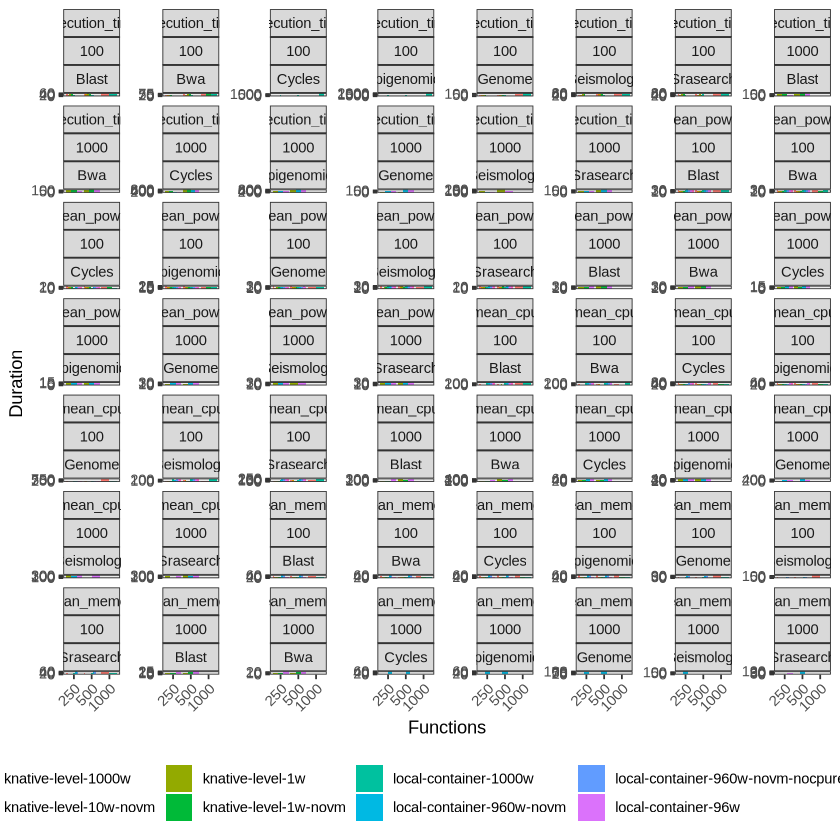

In [18]:
ggplot(df_all_out_gathered,
        aes(x = as.factor(size), y = value, fill=as.factor(paradigm))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        facet_wrap(as.factor(df_all_out_gathered$metric) ~ as.factor(df_all_out_gathered$cpu_work) + as.factor(df_all_out_gathered$name), scales='free_y', labeller = label_scenarios) +
        #scale_color_brewer(palette="Dark2", breaks=c('K8S ImageLocality', 'CacheLocality', 'FOA')) +
        #scale_color_discrete() + 
        labs(x = "Functions", y = "Duration", color = "N-cores") +
        theme_bw() +
        theme(
            #strip.text.x = element_text(size=26),
            legend.position= "bottom",
            #axis.text=element_text(size=24),
            #axis.title=element_text(size=28),
            #legend.title=element_text(size=20), 
            #legend.text=element_text(size=20),
            axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
        guides(color=guide_legend(nrow=2,byrow=TRUE, title.position = "top"))
        ggsave("metrics_per_workflow.png", width = 14, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

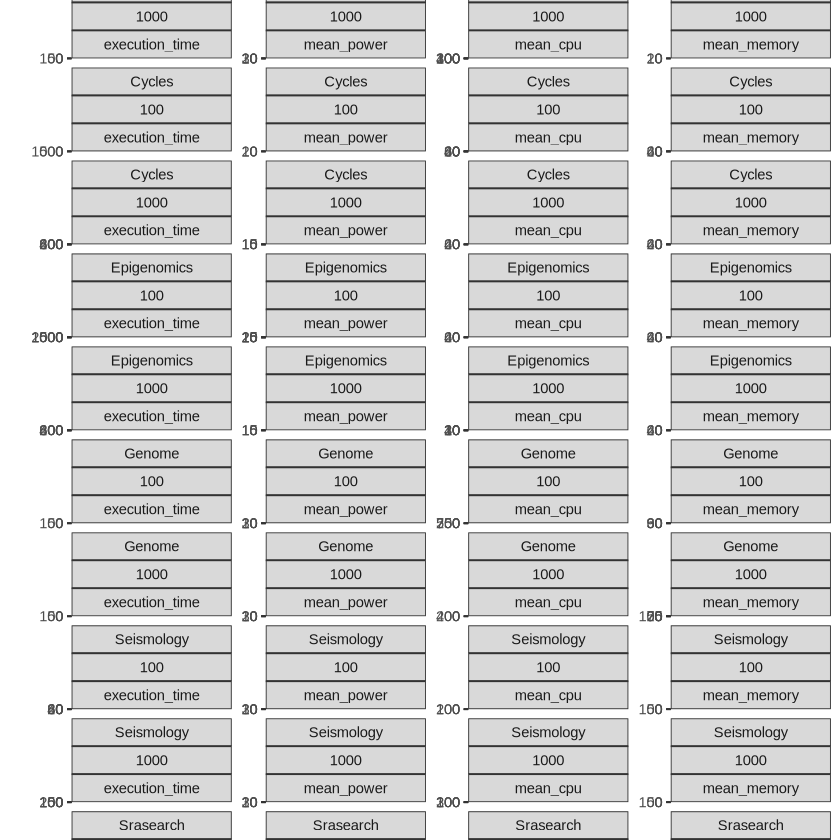

In [19]:
df_plot <- df_all_out_gathered #%>% #%>% filter(name == 'Blast')  
    #filter(paradigm == 'knative-level-1w' | paradigm == 'knative-level-1w-novm' | paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=as.factor(paradigm))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        facet_wrap(as.factor(df_plot$name) ~ as.factor(df_plot$cpu_work) + as.factor(df_plot$metric), 
                   labeller = label_scenarios, scales='free_y', ncol = 4) +
        #scale_color_brewer(palette="Dark2", breaks=c('K8S ImageLocality', 'CacheLocality', 'FOA')) +
        #scale_color_discrete() + 
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
            #strip.text.x = element_text(size=26),
            legend.position= "bottom",
            #axis.text=element_text(size=24),
            #axis.title=element_text(size=28),
            #legend.title=element_text(size=20), 
            #legend.text=element_text(size=20),
            axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
        guides(color=guide_legend(nrow=2,byrow=TRUE, title.position = "top"))
        ggsave("workflows.png", width = 14, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

df_plot <- df_all_out_gathered %>% filter(cpu_work == '100')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=as.factor(paradigm))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        facet_wrap(as.factor(df_plot$name) ~ as.factor(df_plot$metric), 
                   labeller = label_scenarios, scales='free_y', ncol = 4) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=1), vjust=-1, hjust=-0.25, size = 4, angle = 45) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(color=guide_legend(nrow=10,byrow=TRUE, title.position = "top"))
        ggsave("workflows_100cpu.png", width = 14, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

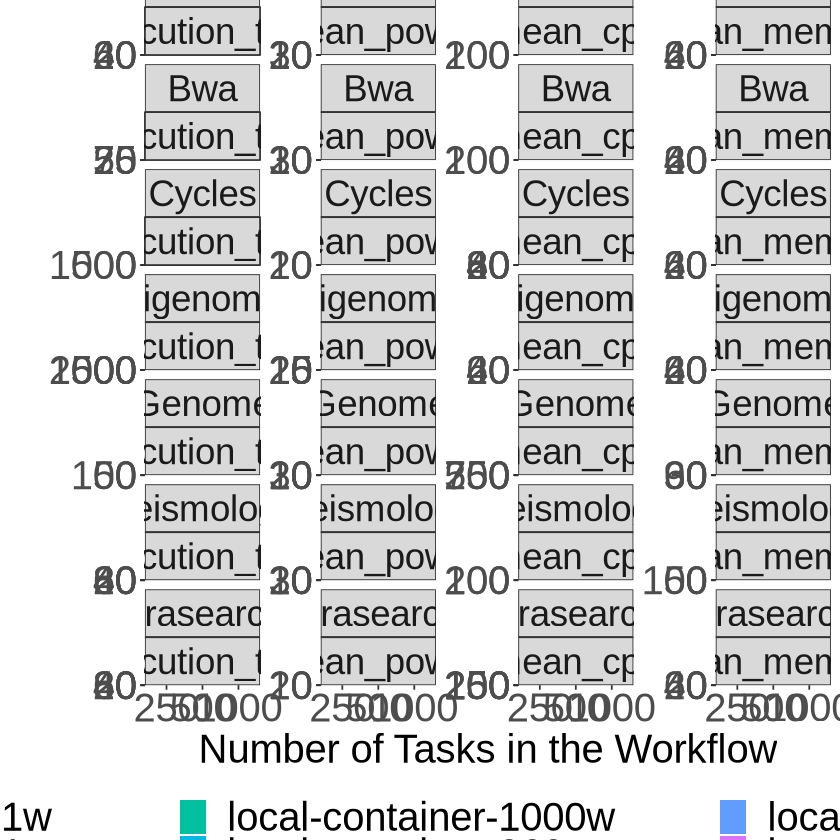

In [20]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') #%>% #%>% filter(name == 'Blast')  
    #filter(paradigm == 'knative-level-1w' | paradigm == 'knative-level-1w-novm' | paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=as.factor(paradigm))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        facet_wrap(as.factor(df_plot$name) ~ as.factor(df_plot$metric), 
                   labeller = label_scenarios, scales='free_y', ncol = 4) +
        #scale_color_brewer(palette="Dark2", breaks=c('K8S ImageLocality', 'CacheLocality', 'FOA')) +
        #scale_color_discrete() + 
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

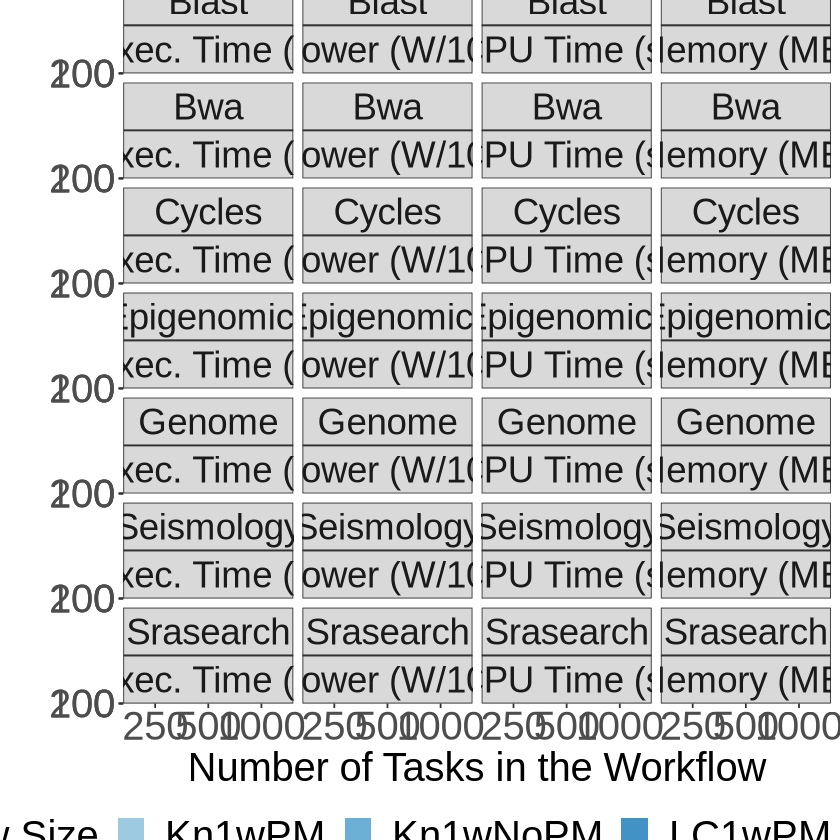

In [21]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1w' | paradigm == 'knative-level-1w-novm' | paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.5, hjust=-0.25, size = 7, angle = 45) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_1w.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

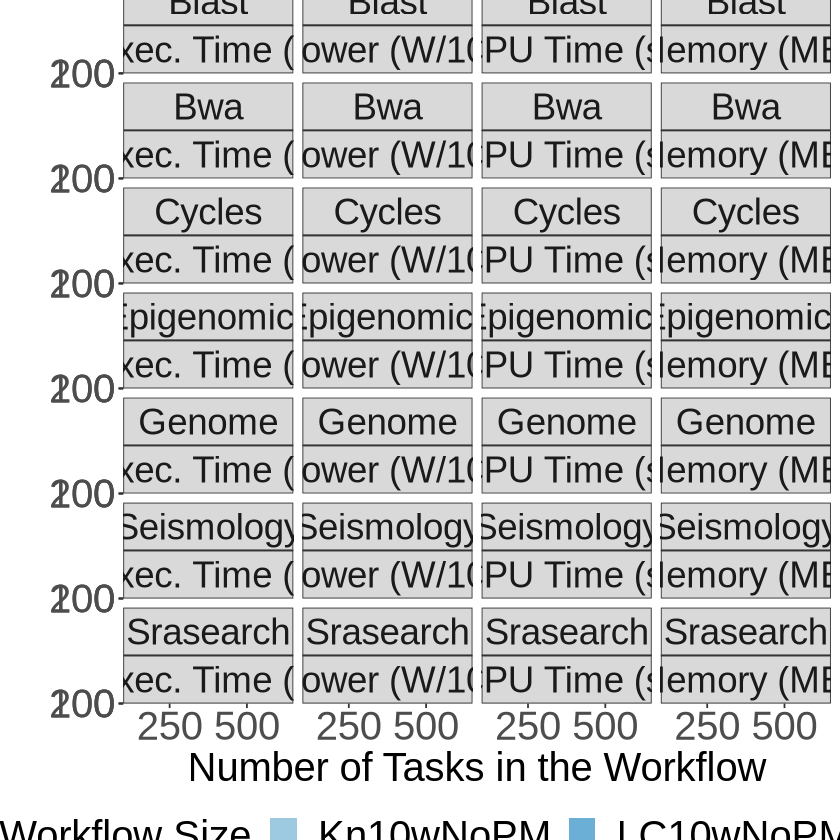

In [22]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10w.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

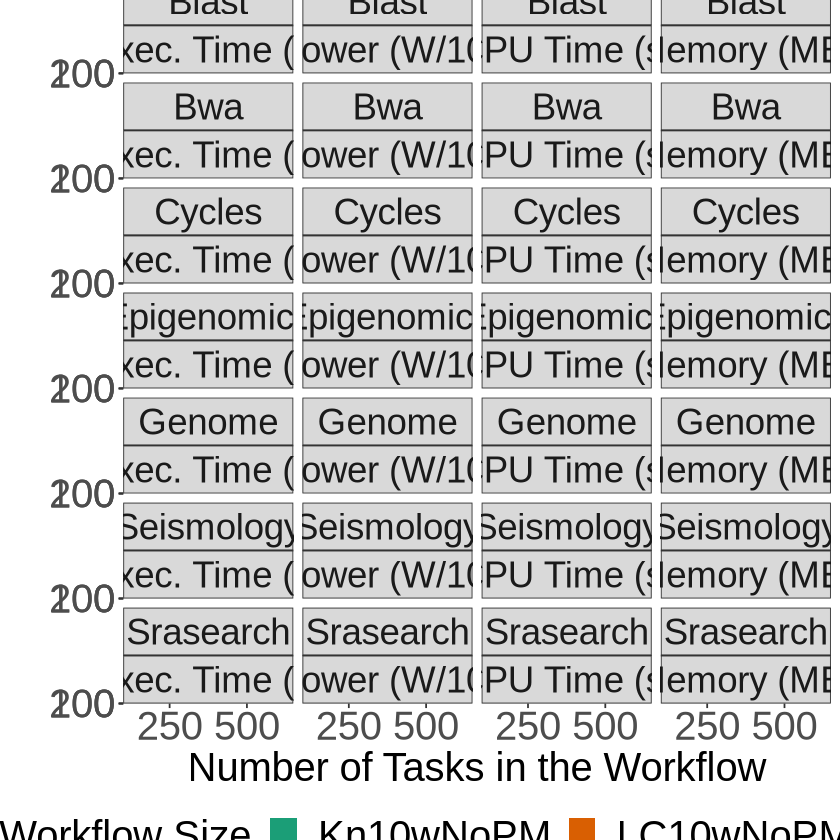

In [23]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_fill_brewer(palette="Dark2", labels = label_paradigm) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10wv2.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [24]:
df_test <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm') %>%
    group_by(name, size, cpu_work, metric) %>%
    arrange(abbreviation) %>%
    mutate(
        #comparison = (value - lag(value)) / lag(value) * 100, #value - lag(value),
        comparison = (value / lag(value)), #/ lag(value) * 100, #value - lag(value),
        name = factor(name), 
        metric = factor(metric, levels = c("execution_time", "mean_power", "mean_cpu", "mean_memory")),
        binnary = case_when(
            value == max(value) ~ 1,
            value == min(value) ~ -1,
            TRUE ~ 0),
      ) %>%
    ungroup() %>%
    drop_na() %>%
    select(-paradigm, -abbreviation, -value, -cpu_work)

head(df_test)
tail(df_test)
summary(df_test)
#head(df_test %>% filter (name == 'Blast' & cpu_work == 100 & metric == 'execution_time'))

name,size,metric,comparison,binnary
<fct>,<dbl>,<fct>,<dbl>,<dbl>
Blast,250,execution_time,0.4074074,-1
Blast,500,execution_time,0.3571429,-1
Bwa,250,execution_time,0.2162162,-1
Bwa,500,execution_time,0.3333333,-1
Cycles,250,execution_time,0.7049180,-1
Cycles,500,execution_time,0.9782609,-1


name,size,metric,comparison,binnary
<fct>,<dbl>,<fct>,<dbl>,<dbl>
Genome,250,mean_memory,4.632935,1
Genome,500,mean_memory,4.072055,1
Seismology,250,mean_memory,4.673674,1
Seismology,500,mean_memory,4.550393,1
Srasearch,250,mean_memory,4.558156,1
Srasearch,500,mean_memory,4.455536,1


          name        size                metric     comparison    
 Blast      :8   Min.   :250   execution_time:14   Min.   :0.2162  
 Bwa        :8   1st Qu.:250   mean_power    :14   1st Qu.:1.0265  
 Cycles     :8   Median :375   mean_cpu      :14   Median :1.6430  
 Epigenomics:8   Mean   :375   mean_memory   :14   Mean   :2.2703  
 Genome     :8   3rd Qu.:500                       3rd Qu.:4.0845  
 Seismology :8   Max.   :500                       Max.   :4.9960  
 Srasearch  :8                                                     
    binnary    
 Min.   :-1.0  
 1st Qu.: 0.5  
 Median : 1.0  
 Mean   : 0.5  
 3rd Qu.: 1.0  
 Max.   : 1.0  
               

ggplot(df_test %>% filter(size == 250), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  theme_minimal() +
  labs(title = "Workflow Size 250", x = "Metric", y = "Workflow Name", fill = "Ratio:\n serverless/ \n local containers") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
       axis.text.y = element_text(angle = 45, hjust = 1),
       #legend.position= "none",
       #axis.title.x = element_blank(),
       axis.ticks = element_blank(),
       panel.grid = element_blank()
       ) +
  guides(
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=1,byrow=TRUE),
        
  )
  ggsave("workflows_100cpu_10w_heatmap250.jpg") #+ 

ggplot(df_test %>% filter(size == 500), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5)  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  theme_minimal() +
  labs(title = "Workflow Size 500",x = "Metric", y = "Workflow Name", fill = "Ratio: \n serverless / \n local containers") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
       axis.text.y = element_text(angle = 45, hjust = 1),
       #axis.title.y = element_blank(),
       #axis.text.y = element_blank(),
       #axis.title.x = element_blank(),
       axis.ticks.x = element_blank(),
       panel.grid = element_blank()
       )  + 
  guides(
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=1,byrow=TRUE),
          )
  ggsave("workflows_100cpu_10w_heatmap500.jpg") #+ 

[1] "#A50026" "white"   "#A6D96A" "#66BD63" "#1A9850" "#006837"

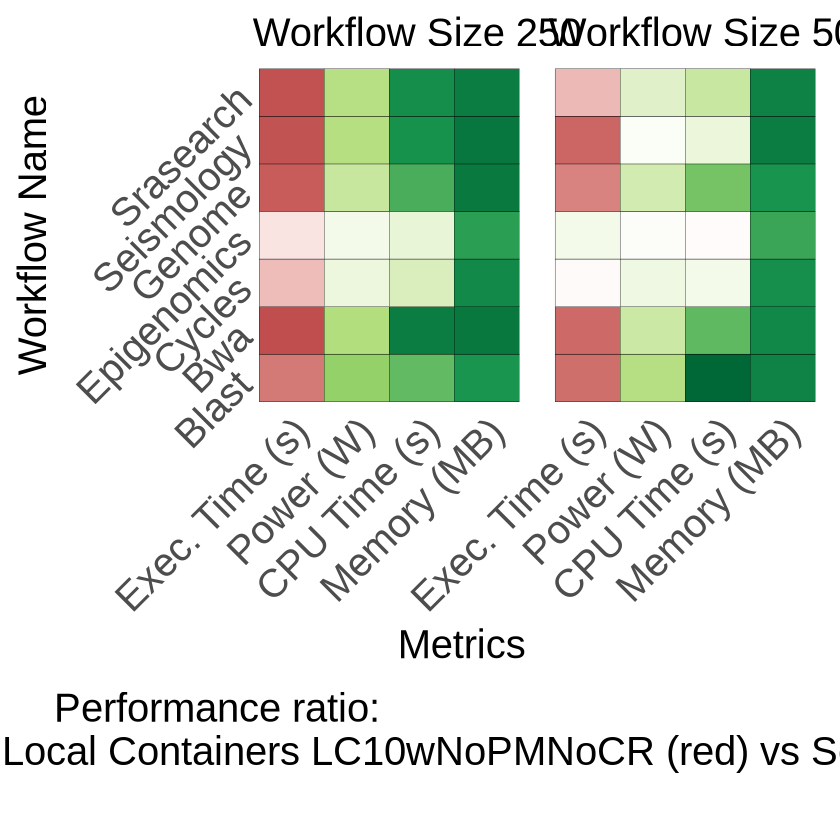

In [27]:
#df_plot <- df_test %>% filter(metric == 'execution_time')
#viridis_colors <- c("#440154FF", "white", "#21908CFF", "#FDE725FF")  # Equivalent to viridi  # Generate 5 colors from the viridis palette
viridis_colors <- c("#440154FF", "white", "#482777FF","#3E4A8EFF","#2C7FB8FF", "#1F9E89FF","#FDE725FF")
viridis_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)  # Generate a palette
#viridis_colors <- colorRampPalette(brewer.pal(11, "RdBu"))(6)  # Generate a palette
viridis_colors <- c(viridis_colors[1:1], "white", viridis_colors[2:2])
#viridis_colors <- c(brewer.pal(9, "RdYlGn")[1:1], "white", brewer.pal(9, "RdYlGn")[2:5])

colors <- c(brewer.pal(11, "RdYlGn")[1:1], brewer.pal(11, "RdYlGn")[7:11])
viridis_colors <- c(colors[1:1], "white", colors[3:6])

#high = "green", low = "white"

viridis_colors
#custom_colors <- c(viridis_colors[1:2], "white", viridis_colors[3:5])  # Insert white color at the desired position
breaks <- c(0, 1, 2, 3, 4, 5)
x_labels <- c("Exec. Time (s)", "Power (W)", "CPU Time (s)", "Memory (MB)")

h1 <- ggplot(df_test %>% filter(size == 250), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  theme_minimal() +
  labs(title = "Workflow Size 250", x = "Metrics", y = "Workflow Name", fill = "Performance ratio:                                                                                           \n                                                                                Local Containers LC10wNoPMNoCR (red) vs Serverless Kn10wNoPM (green)\n") +
  theme(
       axis.text.x = element_text(size = 24, angle = 45, hjust = 1),
       axis.text.y = element_text(size = 24, angle = 45, hjust = 1),
       
       axis.title.x = element_text(size = 24, hjust = 1, vjust = 0.45),
       axis.title.y = element_text(size = 24),
       plot.title = element_text(size = 24),
      
       axis.ticks = element_blank(),
       
       panel.grid = element_blank(),
       legend.title = element_text(hjust = 1, size = 24), 
       legend.position = "bottom",
       legend.text = element_text(size = 24),
       legend.key.size = unit(2.5, 'lines')
       
       ) +
  guides(title=guide_legend(nrow=4,byrow=TRUE),
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=1,byrow=TRUE),
        
  )
  #ggsave("workflows_100cpu_10w_heatmap250.jpg") #+ 

h2 <- ggplot(df_test %>% filter(size == 500), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  theme_minimal() +
  labs(title = "Workflow Size 500", x = "Metrics", y = "Workflow Name", fill = "Performance ratio: serverless (green) / local containers (red) \n\n") +
  theme(axis.text.x = element_text(size = 24,angle = 45, hjust = 1),
       #axis.text.y = element_text(angle = 45, hjust = 1),
       strip.text.x = element_text(size=22),

       legend.position = "none", #c(0.8, 0.2), #
       plot.title = element_text(size = 24),
       axis.title.y = element_blank(),
       axis.text.y = element_blank(),
       axis.title.x = element_blank(),
       axis.ticks.x = element_blank(),
       panel.grid = element_blank(),

       axis.text=element_text(),

       )  + 
  guides(
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=2,byrow=TRUE),
          )

  #ggsave("workflows_100cpu_10w_heatmap500.jpg") #+ 

# Combine the combined_plot with the empty_plot containing the x-axis title
final_plot <- (h1 + h2 )

# Print the final plot
print(final_plot)
ggsave("workflows_100cpu_10w_heatmap_combined.png", plot = final_plot, width = 20, height = 16, units = "in", dpi = 300)

[1] "#A50026" "white"   "#A6D96A" "#66BD63" "#1A9850" "#006837"

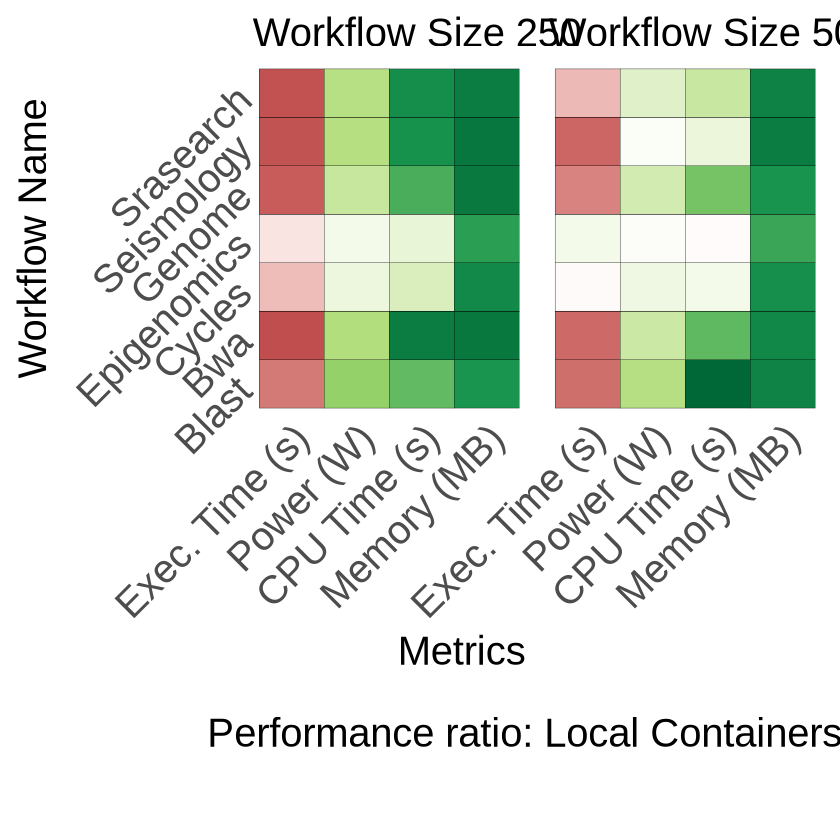

In [28]:
#df_plot <- df_test %>% filter(metric == 'execution_time')
#viridis_colors <- c("#440154FF", "white", "#21908CFF", "#FDE725FF")  # Equivalent to viridi  # Generate 5 colors from the viridis palette
viridis_colors <- c("#440154FF", "white", "#482777FF","#3E4A8EFF","#2C7FB8FF", "#1F9E89FF","#FDE725FF")
viridis_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)  # Generate a palette
#viridis_colors <- colorRampPalette(brewer.pal(11, "RdBu"))(6)  # Generate a palette
viridis_colors <- c(viridis_colors[1:1], "white", viridis_colors[2:2])
#viridis_colors <- c(brewer.pal(9, "RdYlGn")[1:1], "white", brewer.pal(9, "RdYlGn")[2:5])

colors <- c(brewer.pal(11, "RdYlGn")[1:1], brewer.pal(11, "RdYlGn")[7:11])
viridis_colors <- c(colors[1:1], "white", colors[3:6])

#high = "green", low = "white"

viridis_colors
#custom_colors <- c(viridis_colors[1:2], "white", viridis_colors[3:5])  # Insert white color at the desired position
breaks <- c(0, 1, 2, 3, 4, 5)
x_labels <- c("Exec. Time (s)", "Power (W)", "CPU Time (s)", "Memory (MB)")

h1 <- ggplot(df_test %>% filter(size == 250), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  theme_minimal() +
  labs(title = "Workflow Size 250", x = "Metrics", y = "Workflow Name", fill = "                                                                                            Performance ratio: Local Containers (red) vs Serverless (green)\n") +
  theme(
       axis.text.x = element_text(size = 24, angle = 45, hjust = 1),
       axis.text.y = element_text(size = 24, angle = 45, hjust = 1),
       
       axis.title.x = element_text(size = 24, hjust = 1, vjust = 0.45),
       axis.title.y = element_text(size = 24),
       plot.title = element_text(size = 24),
      
       axis.ticks = element_blank(),
       
       panel.grid = element_blank(),
       legend.title = element_text(hjust = 1, size = 24), 
       legend.position = "bottom",
       legend.text = element_text(size = 24),
       legend.key.size = unit(2.5, 'lines')
       
       ) +
  guides(title=guide_legend(nrow=4,byrow=TRUE),
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=1,byrow=TRUE),
        
  )
  #ggsave("workflows_100cpu_10w_heatmap250.jpg") #+ 

h2 <- ggplot(df_test %>% filter(size == 500), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  theme_minimal() +
  labs(title = "Workflow Size 500", x = "Metrics", y = "Workflow Name", fill = "Performance ratio: serverless (green) / local containers (red) \n\n") +
  theme(axis.text.x = element_text(size = 24,angle = 45, hjust = 1),
       #axis.text.y = element_text(angle = 45, hjust = 1),
       strip.text.x = element_text(size=22),

       legend.position = "none", #c(0.8, 0.2), #
       plot.title = element_text(size = 24),
       axis.title.y = element_blank(),
       axis.text.y = element_blank(),
       axis.title.x = element_blank(),
       axis.ticks.x = element_blank(),
       panel.grid = element_blank(),

       axis.text=element_text(),

       )  + 
  guides(
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=2,byrow=TRUE),
          )

  #ggsave("workflows_100cpu_10w_heatmap500.jpg") #+ 

# Combine the combined_plot with the empty_plot containing the x-axis title
final_plot <- (h1 + h2 )

# Print the final plot
print(final_plot)
ggsave("workflows_100cpu_10w_heatmap_combined2.png", plot = final_plot, width = 20, height = 16, units = "in", dpi = 300)

[1] "#A50026" "white"   "#A6D96A" "#66BD63" "#1A9850" "#006837"

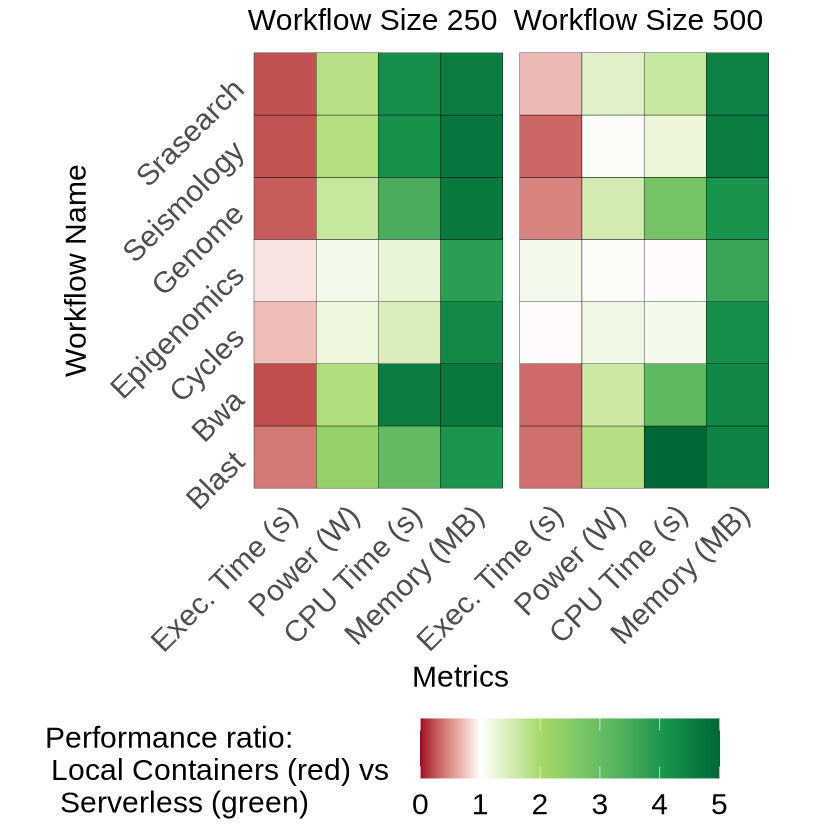

In [29]:
#df_plot <- df_test %>% filter(metric == 'execution_time')
#viridis_colors <- c("#440154FF", "white", "#21908CFF", "#FDE725FF")  # Equivalent to viridi  # Generate 5 colors from the viridis palette
viridis_colors <- c("#440154FF", "white", "#482777FF","#3E4A8EFF","#2C7FB8FF", "#1F9E89FF","#FDE725FF")
viridis_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)  # Generate a palette
#viridis_colors <- colorRampPalette(brewer.pal(11, "RdBu"))(6)  # Generate a palette
viridis_colors <- c(viridis_colors[1:1], "white", viridis_colors[2:2])
#viridis_colors <- c(brewer.pal(9, "RdYlGn")[1:1], "white", brewer.pal(9, "RdYlGn")[2:5])

colors <- c(brewer.pal(11, "RdYlGn")[1:1], brewer.pal(11, "RdYlGn")[7:11])
viridis_colors <- c(colors[1:1], "white", colors[3:6])

#high = "green", low = "white"

viridis_colors
#custom_colors <- c(viridis_colors[1:2], "white", viridis_colors[3:5])  # Insert white color at the desired position
breaks <- c(0, 1, 2, 3, 4, 5)
x_labels <- c("Exec. Time (s)", "Power (W)", "CPU Time (s)", "Memory (MB)")

h1 <- ggplot(df_test %>% filter(size == 250), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  coord_fixed(ratio = 1) +
  theme_minimal() +
  labs(title = "Workflow Size 250", x = "Metrics", y = "Workflow Name", fill = "Performance ratio:              \n  Local Containers (red) vs  \n Serverless (green)            ") +
  theme(
       axis.text.x = element_text(size = 18, angle = 45, hjust = 1),
       axis.text.y = element_text(size = 18, angle = 45, hjust = 1),
       
       axis.title.x = element_text(size = 18, hjust = 1, vjust = 0.45),
       axis.title.y = element_text(size = 18),
       plot.title = element_text(size = 18),
      
       axis.ticks = element_blank(),
       
       panel.grid = element_blank(),
       legend.title = element_text(hjust = 1, size = 18), 
       legend.position = "bottom",
       legend.text = element_text(size = 18),
       legend.key.size = unit(2.5, 'lines'),
      plot.margin = unit(c(0, 0, 0, 0), "cm"),  # Remove plot margins
       
       ) +
  guides(title=guide_legend(nrow=4,byrow=TRUE),
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=1,byrow=TRUE),
        
  )
  #ggsave("workflows_100cpu_10w_heatmap250.jpg") #+ 

h2 <- ggplot(df_test %>% filter(size == 500), aes(x = metric, y = name, fill = comparison)) +
  geom_tile(color = "black") +
  scale_fill_gradientn(
    colors = viridis_colors,  # Apply custom colors
    breaks = breaks,  # Set the breakpoints for the color scale
    labels = breaks,  # Label the breakpoints on the legend
    #values = scales::rescale(breaks, to = c(0, 1)),  # Rescale the breakpoints to fit within [0, 1]
    limits = c(0, 5),  # The full range of the color scale
  ) +
  scale_x_discrete(labels = x_labels) +
  coord_fixed(ratio = 1) +
  theme_minimal() +
  labs(title = "Workflow Size 500", x = "Metrics", y = "Workflow Name", fill = "Performance ratio: serverless (green) / local containers (red) \n\n") +
  theme(axis.text.x = element_text(size = 18,angle = 45, hjust = 1),
       #axis.text.y = element_text(angle = 45, hjust = 1),
       strip.text.x = element_text(size=18),

       legend.position = "none", #c(0.8, 0.2), #
       plot.title = element_text(size = 18),
       axis.title.y = element_blank(),
       axis.text.y = element_blank(),
       axis.title.x = element_blank(),
       axis.ticks.x = element_blank(),
       panel.grid = element_blank(),

       axis.text=element_text(),
       plot.margin = unit(c(0, 0, 0, 0), "in"),  # Remove plot margins

       )  + 
  guides(
        shape=guide_legend(nrow=1,byrow=TRUE),
        color=guide_legend(nrow=2,byrow=TRUE),
          )

  #ggsave("workflows_100cpu_10w_heatmap500.jpg") #+ 

# Combine the combined_plot with the empty_plot containing the x-axis title
final_plot <- h1 + h2

# Print the final plot
print(final_plot)
ggsave("workflows_100cpu_10w_heatmap_combined3.png", plot = final_plot, width = 12, height = 8, units = "in", dpi = 300)

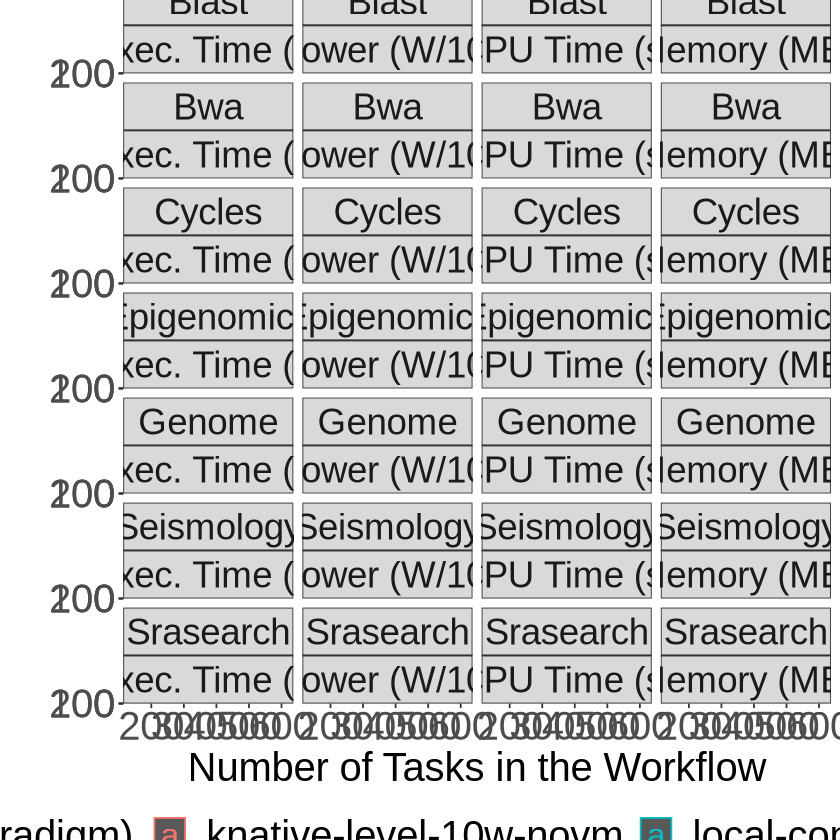

In [30]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = size, y = value, color=as.factor(paradigm))) + #, shape=p_size)) +
        geom_line() + 
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_fill_brewer(palette="Dark2", labels = label_paradigm) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10wv3.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

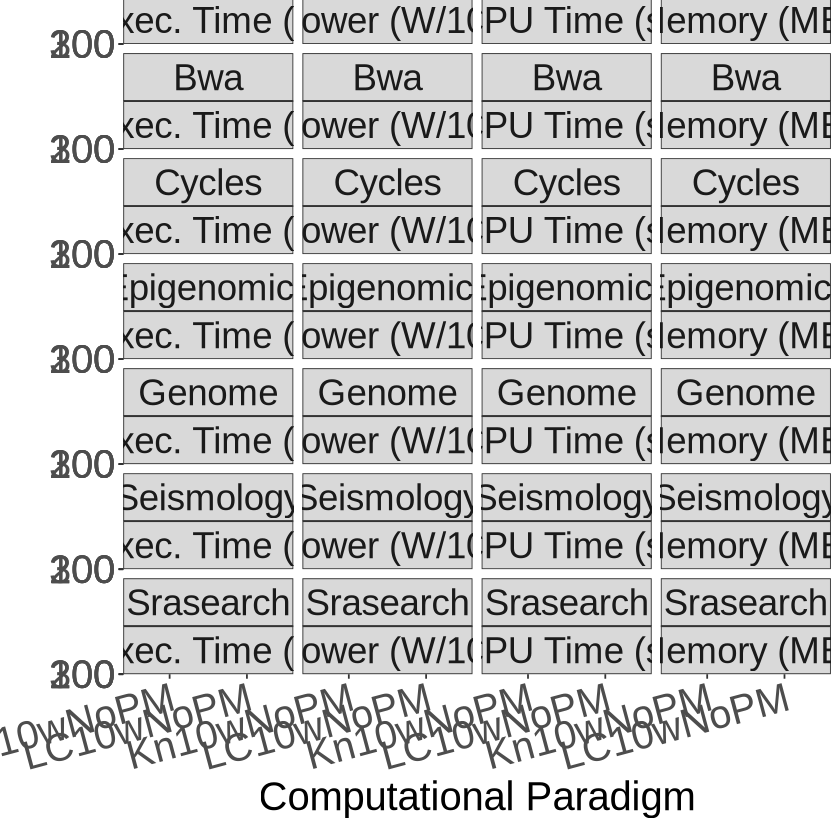

In [32]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        expand_limits(y = max(df_plot$value) + 50) +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                axis.text.x = element_text(angle = 15, vjust = 1, hjust=1),
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10w_per_paradigm.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [67]:
colorRampPalette(brewer.pal(11, "RdYlGn"))(2)
colorRampPalette(brewer.pal(11, "RdYlGn"))(4)
colorRampPalette(brewer.pal(11, "RdYlGn"))(6)
colorRampPalette(brewer.pal(11, "RdYlGn"))(8)
colorRampPalette(brewer.pal(11, "RdYlGn"))(10)

[1] "#A50026" "#006837"

[1] "#A50026" "#FDBE6E" "#B7E075" "#006837"

[1] "#A50026" "#F46D43" "#FEE08B" "#D9EF8B" "#66BD63" "#006837"

[1] "#A50026" "#E34A33" "#FBA45C" "#FEE899" "#E3F399" "#9CD569" "#3AA758"
[8] "#006837"

[1] "#A50026" "#DA362A" "#F67B49" "#FDBE6E" "#FEEDA2" "#E9F6A2" "#B7E075"
 [8] "#74C364" "#229C52" "#006837"

In [ ]:
colors <- c(brewer.pal(11, "RdYlGn")[1:1], brewer.pal(11, "RdYlGn")[7:11])

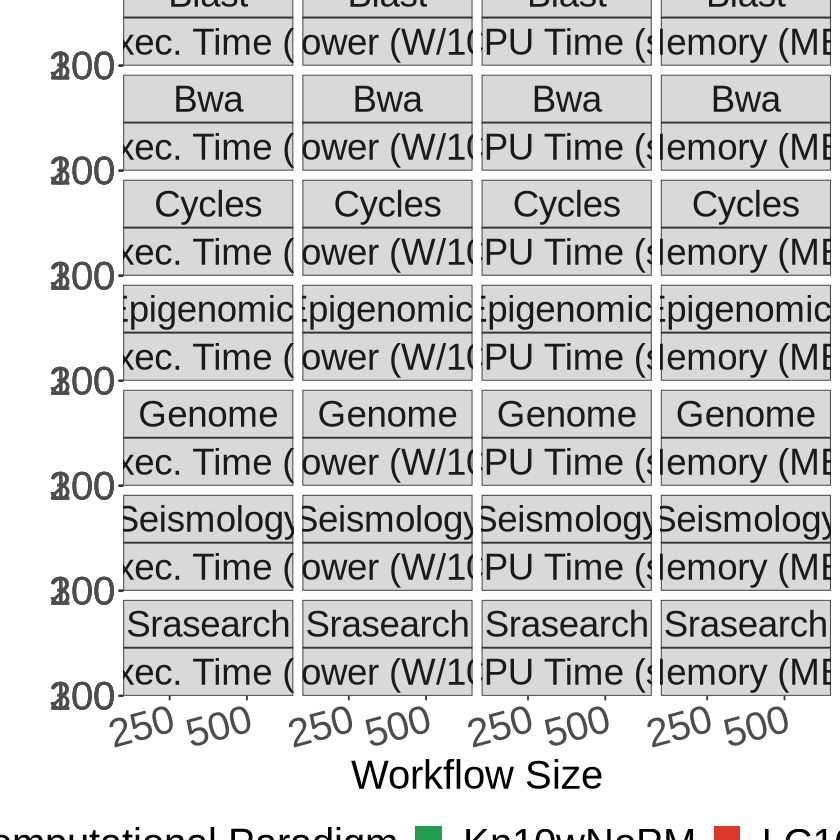

In [69]:
viridis_colors <- c("#440154FF", "white", "#482777FF","#3E4A8EFF","#2C7FB8FF", "#1F9E89FF","#FDE725FF")
viridis_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)  # Generate a palette
#viridis_colors <- colorRampPalette(brewer.pal(11, "RdBu"))(6)  # Generate a palette
viridis_colors <- c(viridis_colors[1:1], "white", viridis_colors[2:2])
#viridis_colors <- c(brewer.pal(9, "RdYlGn")[1:1], "white", brewer.pal(9, "RdYlGn")[2:5])

colors <- c(brewer.pal(11, "RdYlGn")[1:1], brewer.pal(11, "RdYlGn")[7:11])
viridis_colors <- c(colors[1:1], "white", colors[3:6])

palette_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)
palette_colors <- c('#229C52', '#DA362A')

df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill= as.factor(abbreviation))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9) , vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Workflow Size", y = "", fill = "Computational Paradigm") +
        expand_limits(y = max(df_plot$value) + 50) +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                axis.text.x = element_text(angle = 15, vjust = 1, hjust=1),
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10w_per_paradigm2.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [ ]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        expand_limits(y = max(df_plot$value) + 50) +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                axis.text.x = element_text(angle = 15, vjust = 1, hjust=1),
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10w_per_paradigm3.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

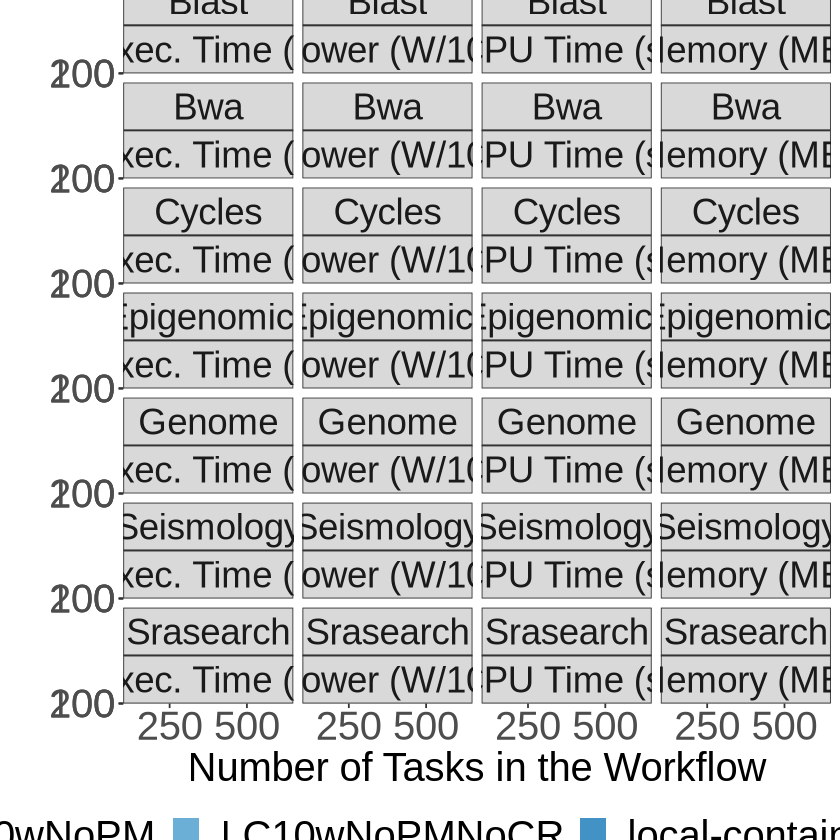

In [33]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm' | paradigm == 'local-container-960w-novm-nocpurequest')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10w2.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

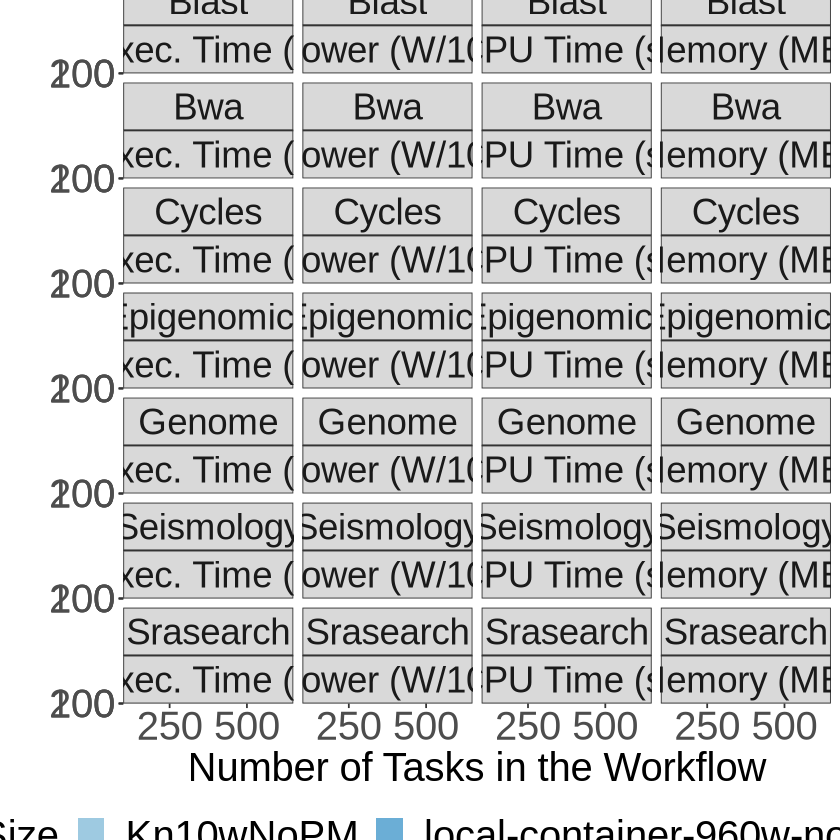

In [34]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm-nocpurequest')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10w-nocpurequest.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

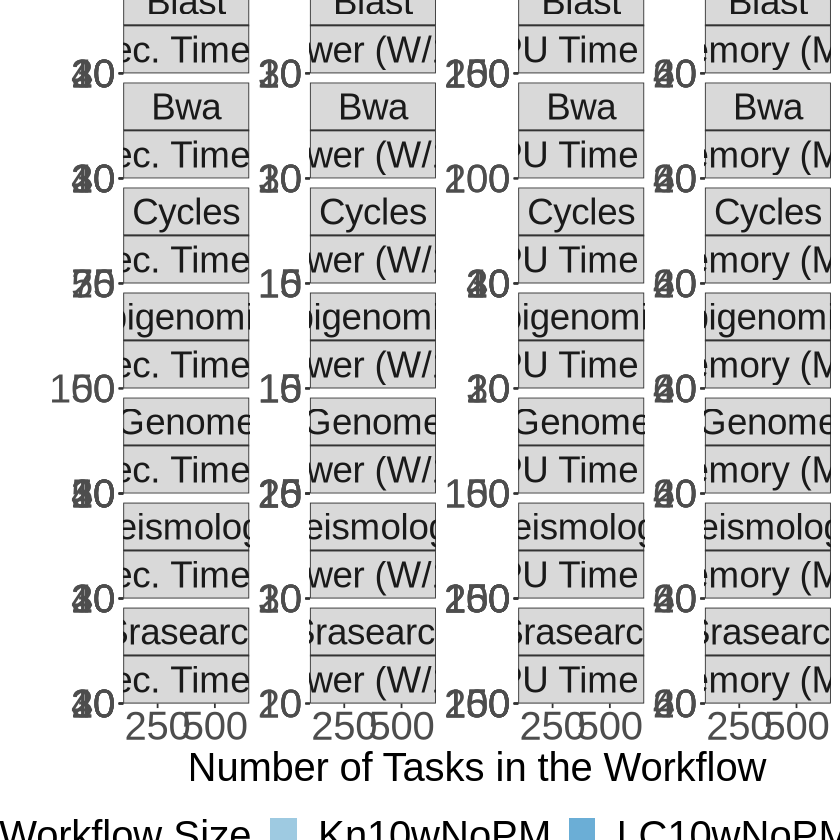

In [35]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-10w-novm' | paradigm == 'local-container-960w-novm')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=as.factor(paradigm))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        #geom_text(aes(label=round(value, digits = 1)), position=position_dodge(width=1), vjust=1.5, hjust=0.75, size = 7, angle = 15) +
        geom_text(aes(label=round(value, digits = 1)), position=position_dodge(width=1), vjust=1.5, size = 7) +
        facet_wrap(name ~ metric, scale= "free_y",
                   labeller = label_scenarios, ncol = 4) +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_100cpu_10wv2.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

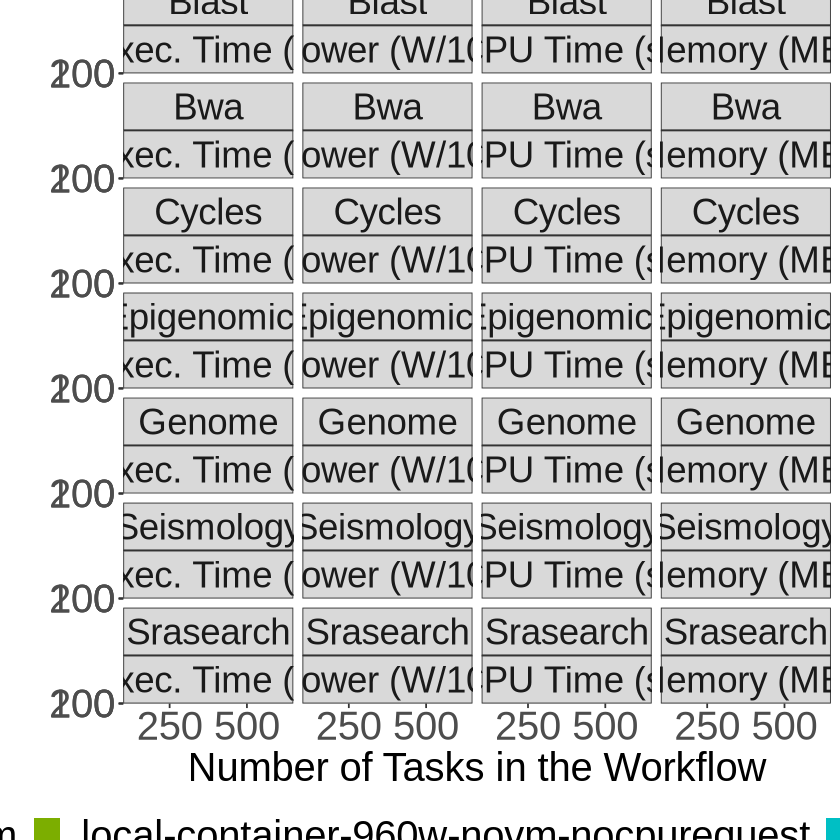

In [36]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm' | 
           paradigm == 'local-container-960w-novm' | paradigm == 'local-container-960w-novm-nocpurequest')
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        #scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_local-level.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

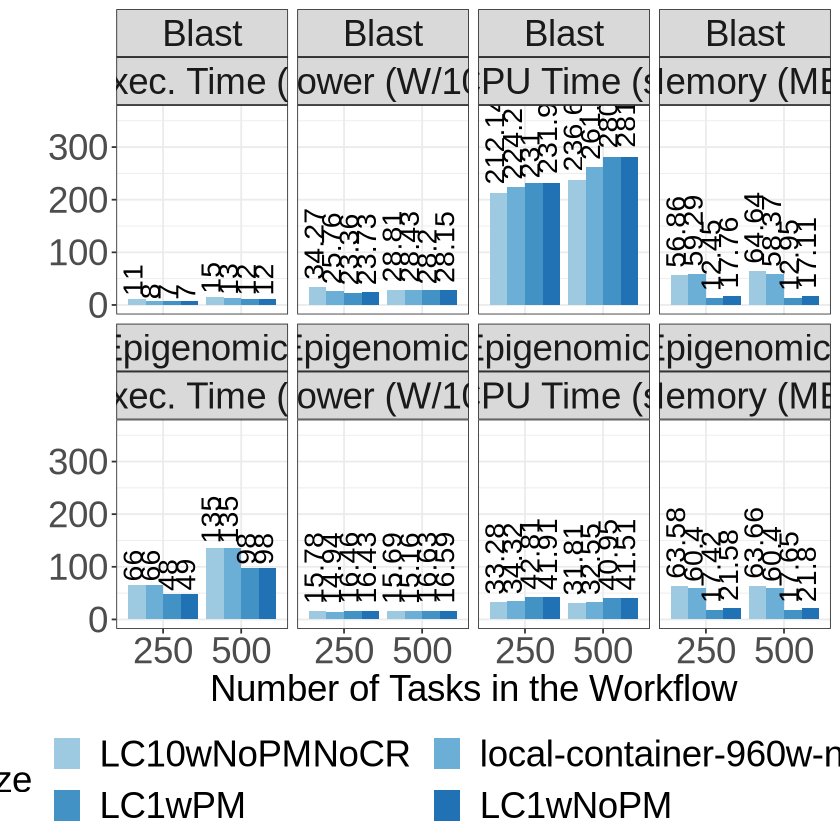

In [37]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm' | 
           paradigm == 'local-container-960w-novm' | paradigm == 'local-container-960w-novm-nocpurequest') %>%
    filter(name == 'Blast' | name == 'Epigenomics')

ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 80) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22), 
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=2,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_local-level_filtered_per_size.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

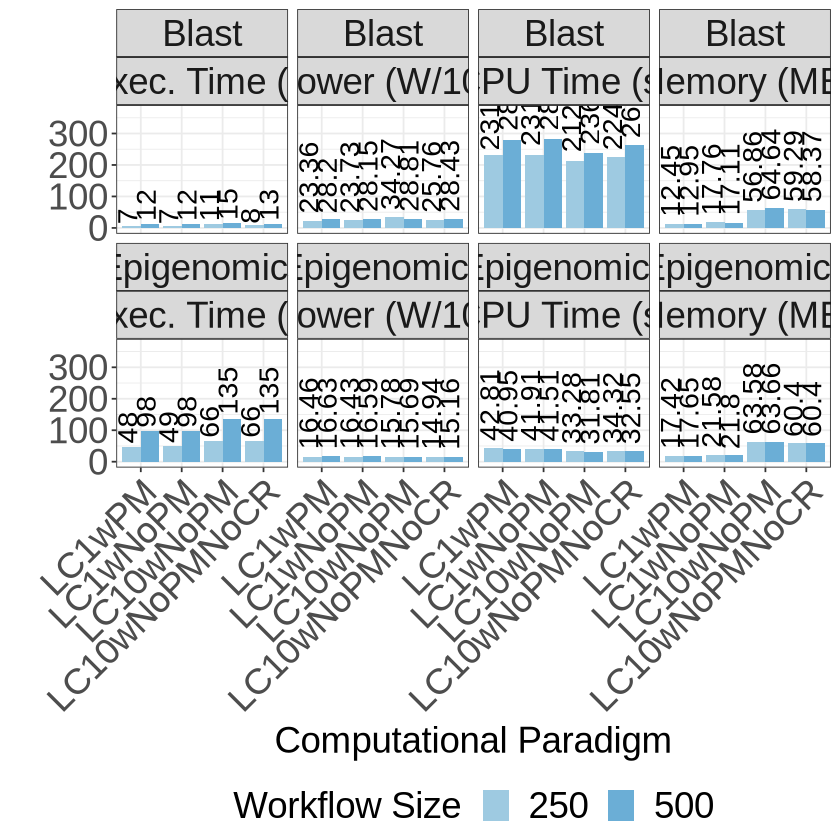

In [38]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm' | 
           paradigm == 'local-container-960w-novm' | paradigm == 'local-container-960w-novm-nocpurequest') %>%
    filter(name == 'Blast' | name == 'Epigenomics')

ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 90) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        #scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("LC1wPM", "LC1wNoPM", "LC10wNoPM", "LC10wNoPMNoCR")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22), 
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),            
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_local-level_filtered_per_paradigm.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [79]:
colorRampPalette(brewer.pal(11, "RdYlGn"))(10)

[1] "#A50026" "#DA362A" "#F67B49" "#FDBE6E" "#FEEDA2" "#E9F6A2" "#B7E075"
 [8] "#74C364" "#229C52" "#006837"

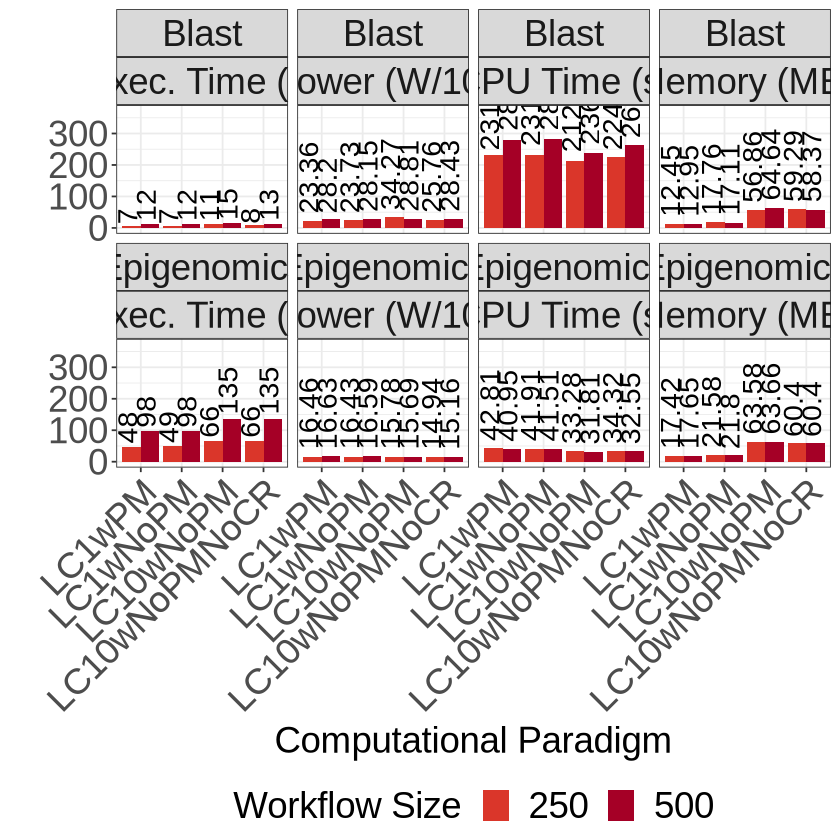

In [78]:
#colorRampPalette(brewer.pal(11, "RdYlGn"))(10)
#palette_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)
palette_colors <- c('#DA362A', '#A50026')
#palette_colors <- c('#229C52', '#006837')

df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'local-container-96w' | paradigm == 'local-container-96w-novm' | 
           paradigm == 'local-container-960w-novm' | paradigm == 'local-container-960w-novm-nocpurequest') %>%
    filter(name == 'Blast' | name == 'Epigenomics')


ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 90) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        #scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("LC1wPM", "LC1wNoPM", "LC10wNoPM", "LC10wNoPMNoCR")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22), 
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),            
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_local-level_filtered_per_paradigm2.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

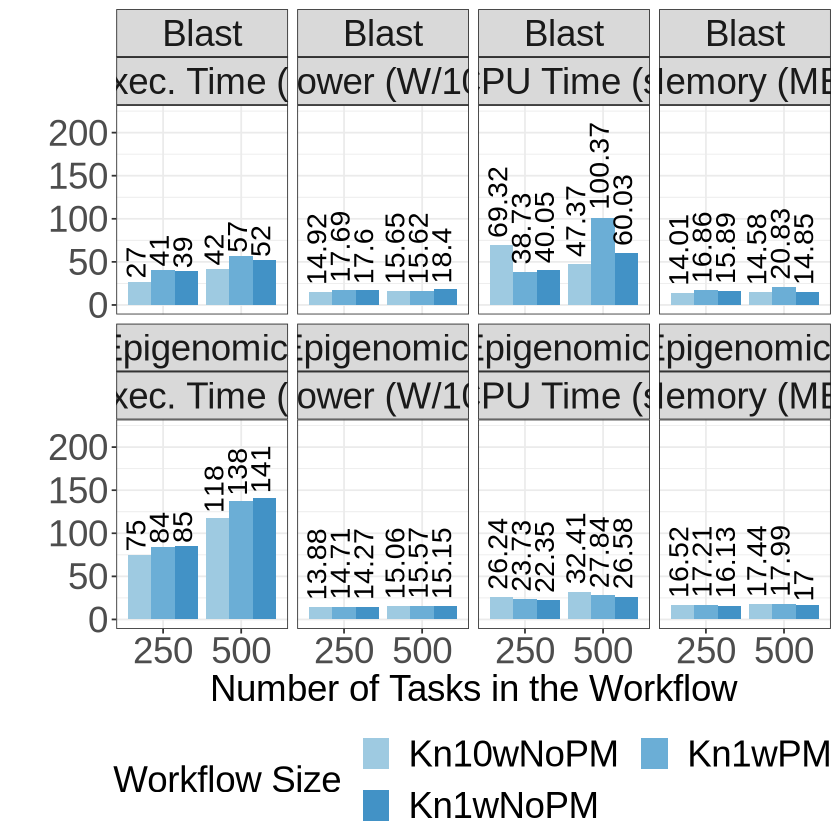

In [39]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100', size != '1000') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1w' | paradigm == 'knative-level-1w-novm' | 
           paradigm == 'knative-level-10w-novm') %>%
    filter(name == 'Blast' | name == 'Epigenomics')

ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 80) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22), 
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=2,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_knative-level_filtered_per_size.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

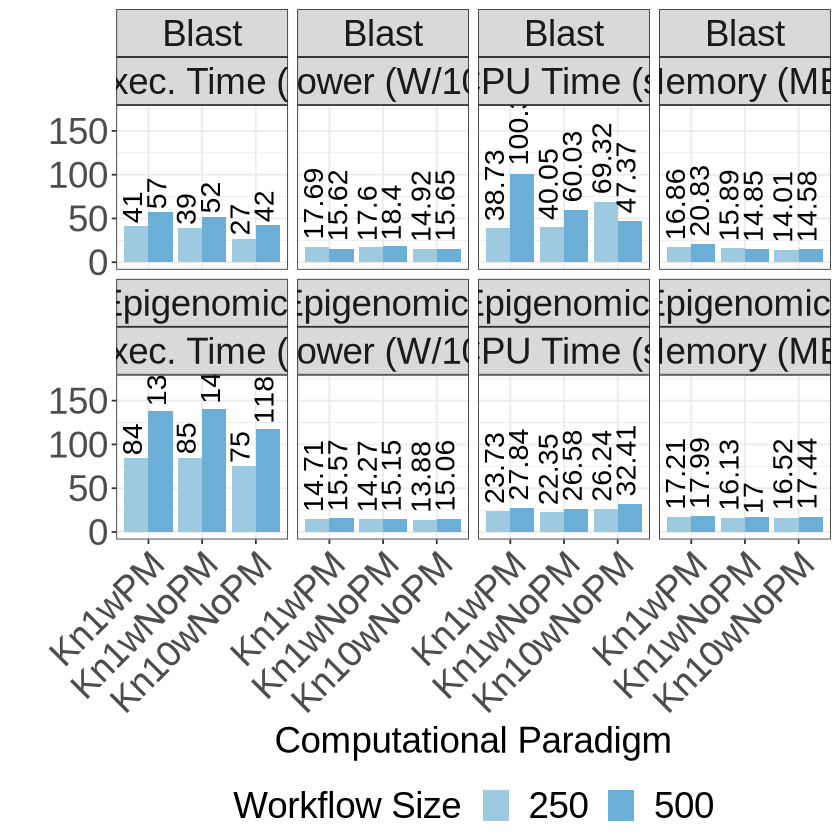

In [40]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100', size != '1000') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1w' | paradigm == 'knative-level-1w-novm' | 
           paradigm == 'knative-level-10w-novm') %>%
    filter(name == 'Blast' | name == 'Epigenomics')

ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size) )) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1wPM", "Kn1wNoPM", "Kn10wNoPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_knative-level_filtered_per_paradigm.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

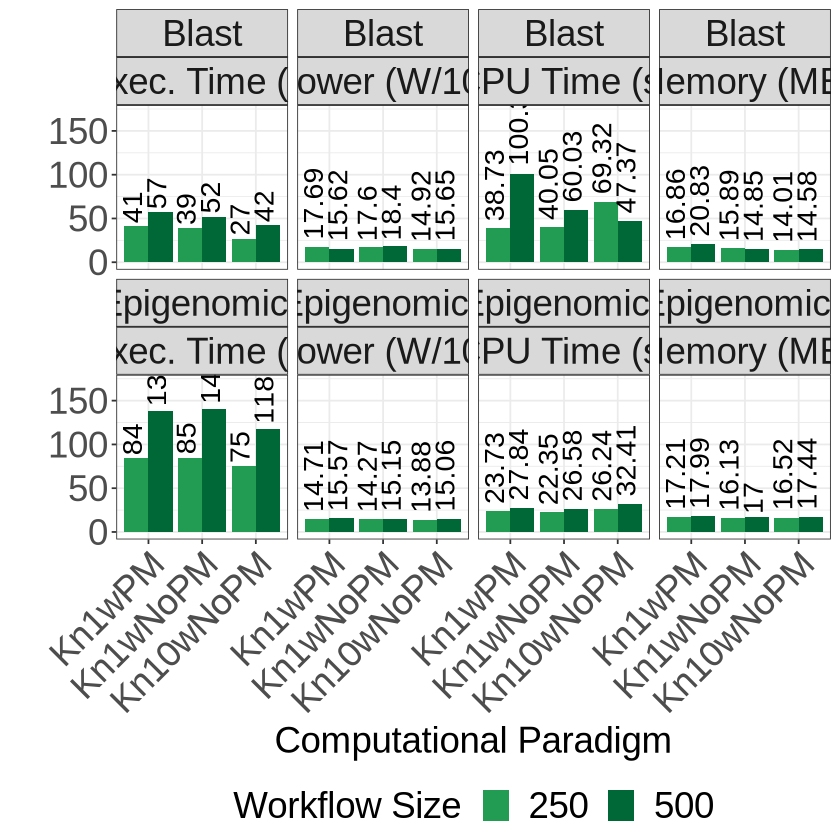

In [81]:
palette_colors <- c('#229C52', '#006837')

df_plot <- df_all_out_gathered %>% filter(cpu_work == '100', size != '1000') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1w' | paradigm == 'knative-level-1w-novm' | 
           paradigm == 'knative-level-10w-novm') %>%
    filter(name == 'Blast' | name == 'Epigenomics')

ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size) )) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1wPM", "Kn1wNoPM", "Kn10wNoPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_knative-level_filtered_per_paradigm2.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [41]:
head(df_all_out_gathered %>% filter(paradigm == 'local-container-1000w'))

name,size,cpu_work,paradigm,abbreviation,metric,value
<chr>,<dbl>,<int>,<chr>,<chr>,<fct>,<dbl>
Blast,250,100,local-container-1000w,LC1000wPM,execution_time,16
Blast,500,100,local-container-1000w,LC1000wPM,execution_time,27
Blast,1000,100,local-container-1000w,LC1000wPM,execution_time,53
Bwa,250,100,local-container-1000w,LC1000wPM,execution_time,17
Bwa,500,100,local-container-1000w,LC1000wPM,execution_time,27
Bwa,1000,100,local-container-1000w,LC1000wPM,execution_time,51


In [42]:
df_plot <- df_all_out_gathered %>% #filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') #%>%
    #filter(name == 'Blast' | name == 'Epigenomics')
#head(df_plot)
#tail(df_plot)

df_plot$size <- as.numeric(df_plot$size)
head(df_plot)

name,size,cpu_work,paradigm,abbreviation,metric,value
<chr>,<dbl>,<int>,<chr>,<chr>,<fct>,<dbl>
Blast,250,100,knative-level-1000w,Kn1000wPM,execution_time,39
Blast,250,100,local-container-1000w,LC1000wPM,execution_time,16
Blast,500,100,knative-level-1000w,Kn1000wPM,execution_time,48
Blast,500,100,local-container-1000w,LC1000wPM,execution_time,27
Blast,1000,100,knative-level-1000w,Kn1000wPM,execution_time,64
Blast,1000,100,local-container-1000w,LC1000wPM,execution_time,53


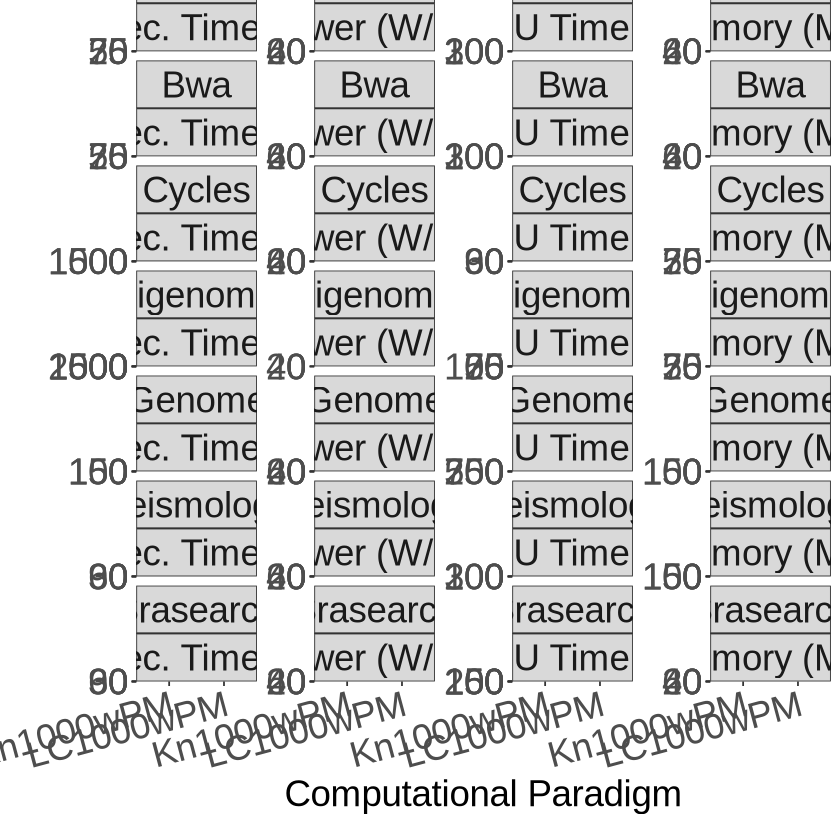

In [43]:
df_plot <- df_all_out_gathered %>% #filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    group_by(name, size, cpu_work, paradigm, abbreviation, metric) %>%
    mutate(max_value = max(value) + 30) %>% # Calculate max value for each category
    mutate(size = as.numeric(size)) %>%
    ungroup()

    # Add invisible points
    df_limits <- df_plot %>%
      distinct(name, size, cpu_work, paradigm, abbreviation, metric, max_value) %>%
      mutate(value = max_value)

ggplot(df_plot, aes(x = abbreviation, y = value, fill=reorder(as.factor(size), size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_bar(data = df_limits, aes(y = value), stat = "identity", position=position_dodge(), alpha = 0) +
        #geom_text(aes(label=round(value, digits = 2)), 
        #              position=position_dodge(width=0.9), 
        #             vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        #expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4,
                  scale='free_y') +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1000wPM", "LC1000wPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 15, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_coarse-grained-knative-level_filtered_per_paradigm.png", width = 20, height = 20, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

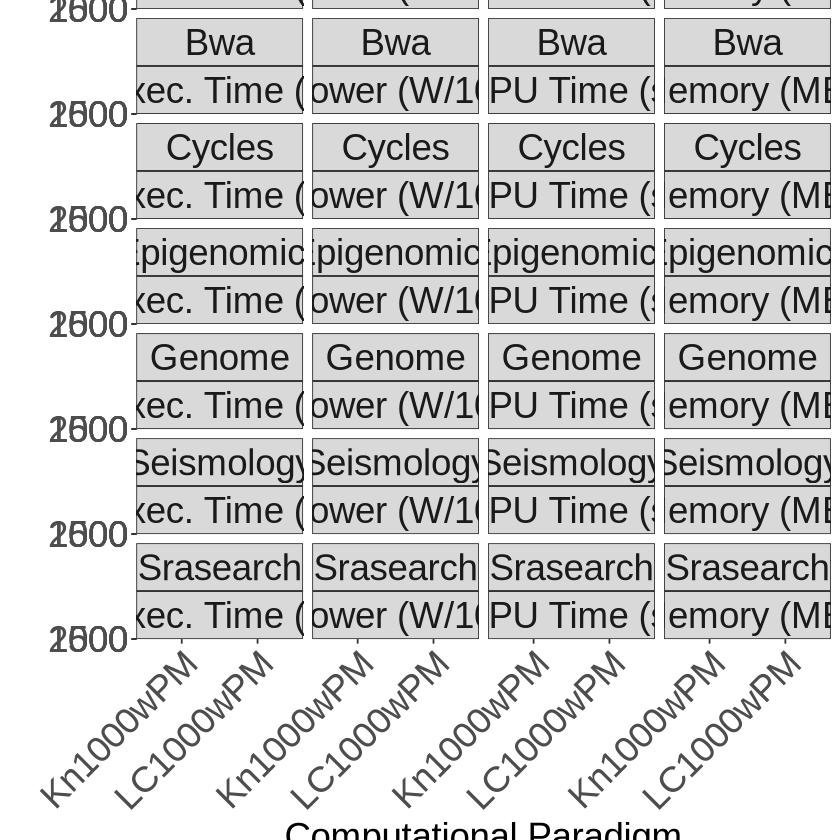

In [44]:
df_plot <- df_all_out_gathered %>% #filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    group_by(name, size, cpu_work, paradigm, abbreviation, metric) %>%
    mutate(max_value = max(value) + 30) %>% # Calculate max value for each category
    mutate(size = as.numeric(size)) %>%
    ungroup()

    # Add invisible points
    df_limits <- df_plot %>%
      distinct(name, size, cpu_work, paradigm, abbreviation, metric, max_value) %>%
      mutate(value = max_value / 2)

ggplot(df_plot, aes(x = abbreviation, y = value, fill=reorder(as.factor(size), size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_bar(data = df_limits, aes(y = value), stat = "identity", position=position_dodge(), alpha = 0) +
        #geom_text(aes(label=round(value, digits = 2)), 
        #              position=position_dodge(width=0.9), 
        #             vjust=+0.3, hjust=-0.1, size = 6, angle = 45) +
        #expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4,
                  ) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1000wPM", "LC1000wPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_coarse-grained-knative-level_filtered_per_paradigm_v2.png", width = 20, height = 20, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

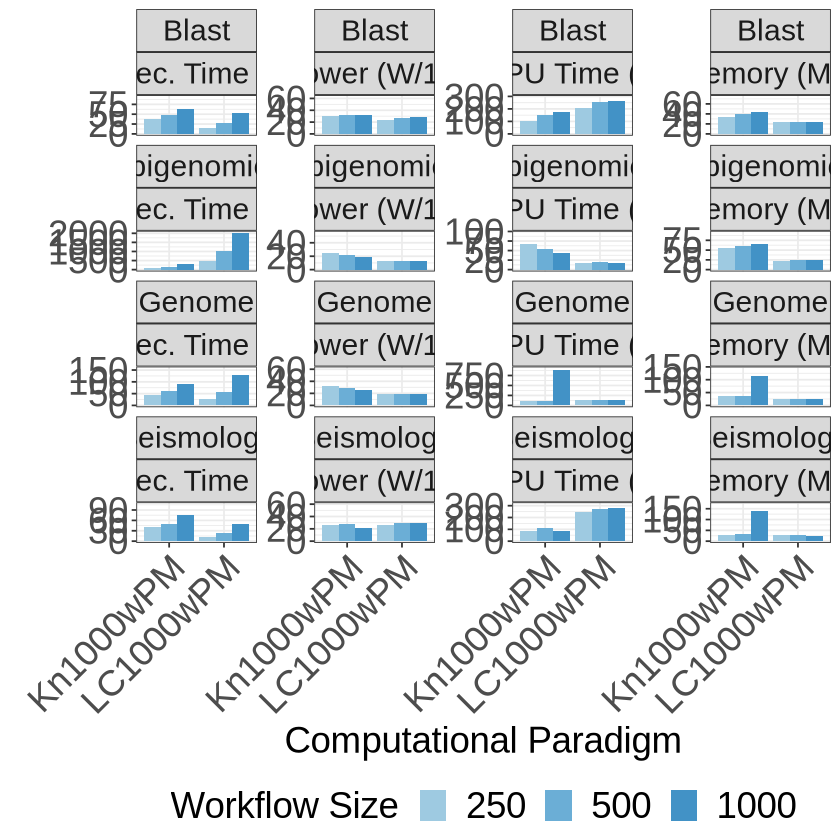

In [45]:
df_plot <- df_all_out_gathered %>% #filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    filter(name == 'Blast' | name == 'Epigenomics' | name == 'Seismology' | name == 'Genome') %>%
    group_by(name, size, cpu_work, paradigm, abbreviation, metric) %>%
    mutate(max_value = max(value) + 30) %>% # Calculate max value for each category
    mutate(size = as.numeric(size)) %>%
    ungroup()

    # Add invisible points
    df_limits <- df_plot %>%
      distinct(name, size, cpu_work, paradigm, abbreviation, metric, max_value) %>%
      mutate(value = max_value)

ggplot(df_plot, aes(x = abbreviation, y = value, fill=reorder(as.factor(size), size))) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_bar(data = df_limits, aes(y = value), stat = "identity", position=position_dodge(), alpha = 0) +
        #geom_text(aes(label=round(value, digits = 2)), 
        #              position=position_dodge(width=0.9), 
        #             vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        #expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4,
                  scale='free_y') +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1000wPM", "LC1000wPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=18),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
                #axis.text.y = element_text(angle = 45, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_coarse-grained-knative-level_filtered_per_paradigm_filtered.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [ ]:
colorRampPalette(brewer.pal(11, "RdYlGn"))(10)
palette_colors <- colorRampPalette(brewer.pal(11, "RdYlGn"))(2)
palette_colors <- c('#229C52', '#DA362A')

In [82]:
colorRampPalette(brewer.pal(11, "RdYlGn"))(10)

[1] "#A50026" "#DA362A" "#F67B49" "#FDBE6E" "#FEEDA2" "#E9F6A2" "#B7E075"
 [8] "#74C364" "#229C52" "#006837"

palette_colors <- c('#229C52', '#DA362A')

df_plot <- df_all_out_gathered %>% #filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    filter(name == 'Blast' | name == 'Epigenomics' | name == 'Seismology' | name == 'Genome') #%>%
    #group_by(name, size, cpu_work, paradigm, abbreviation, metric) %>%
    #mutate(max_value = max(value) + 30) %>% # Calculate max value for each category
    #mutate(size = as.numeric(size)) %>%
    #ungroup()

    # Add invisible points
    #df_limits <- df_plot %>%
    #  distinct(name, size, cpu_work, paradigm, abbreviation, metric, max_value) %>%
    #  mutate(value = max_value)

summary(df_plot)
                aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
ggplot(df_plot, aes(x = as.factor(size), y = value, fill=abbreviation)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4,
                  scale='free_y') +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1000wPM", "LC1000wPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=18),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
                #axis.text.y = element_text(angle = 45, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +
        guides(
                fill=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=2,byrow=TRUE))
        ggsave("workflows_coarse-grained-knative-level_filtered_per_paradigm_filtered2.png", width = 12, height = 12, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)

In [ ]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    filter(name == 'Blast' | name == 'Epigenomics' | name == 'Seismology' | name == 'Genome') #%>%

In [ ]:
df_plot <- df_all_out_gathered %>% #filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    filter(name == 'Blast' | name == 'Epigenomics' | name == 'Seismology' | name == 'Genome') %>%
    group_by(name, size, cpu_work, paradigm, abbreviation, metric) %>%
    mutate(max_value = max(value) + 30) %>% # Calculate max value for each category
    mutate(size = as.numeric(size)) %>%
    ungroup()

    # Add invisible points
    df_limits <- df_plot %>%
      distinct(name, size, cpu_work, paradigm, abbreviation, metric, max_value) %>%
      mutate(value = max_value)

In [ ]:
ggplot(df_plot,
        aes(x = abbreviation, y = value, fill= as.factor(size) )) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        geom_text(aes(label=round(value, digits = 2)), 
                      position=position_dodge(width=0.9), 
                      vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4) +  
        #facet_wrap(name ~ cpu_work + metric, 
        #           labeller = label_scenarios, ncol = 4) +
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        scale_x_discrete(limits = c("Kn1wPM", "Kn1wNoPM", "Kn10wNoPM")) +
        labs(x = "Computational Paradigm", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=22),
                axis.title=element_text(size=22),
                legend.title=element_text(size=22),
                axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
                legend.text=element_text(size=22)) +

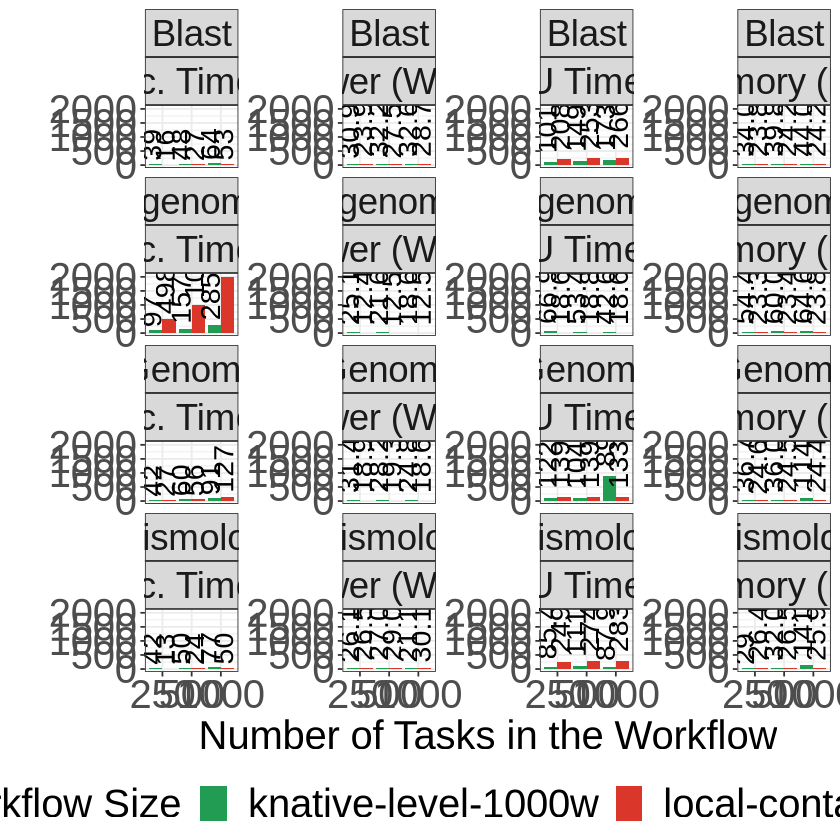

In [106]:
df_plot <- df_all_out_gathered %>% filter(cpu_work == '100') %>% #filter(name == 'Blast')  
    filter(paradigm == 'knative-level-1000w' | paradigm == 'local-container-1000w') %>%
    filter(name == 'Blast' | name == 'Epigenomics' | name == 'Seismology' | name == 'Genome') #%>%
ggplot(df_plot,
        aes(x = as.factor(size), y = value, fill=paradigm)) + #, shape=p_size)) +
        geom_bar(stat="identity", position=position_dodge()) +
        #geom_text(aes(label=round(value, digits = 2)), position=position_dodge(width=0.9), vjust=-0.25, size = 7) +
        geom_text(aes(label=round(value, digits = 2)), 
              position=position_dodge(width=0.9), 
              vjust=+0.3, hjust=-0.1, size = 6, angle = 90) +
        expand_limits(y = max(df_plot$value) + 30) +
        facet_wrap(name ~ metric, 
                   labeller = label_scenarios, ncol = 4, scale='free_y') +  
        scale_fill_manual(values=palette_colors, labels = label_paradigm) +#labels=label_scenarios) +
        labs(x = "Number of Tasks in the Workflow", y = "", fill = "Workflow Size") +
        theme_bw() +
        theme(
                strip.text.x = element_text(size=22),
                legend.position= "bottom",
                axis.text=element_text(size=24),
                axis.title=element_text(size=24),
                legend.title=element_text(size=24), 
                legend.text=element_text(size=24)) +
        guides(
                shape=guide_legend(nrow=1,byrow=TRUE),
                color=guide_legend(nrow=1,byrow=TRUE))
        ggsave("workflows_coarse-grained-knative-level_filtered_per_paradigm_filtered2.png", width = 20, height = 24, units = "in") #+ 
        #ggsave("makespan_per_heterogeneity.pdf", width = 14, height = 12)